In [1]:
import json
import pandas as pd
import numpy as np
from random import randrange
from matplotlib import pyplot as plt
import seaborn as sns

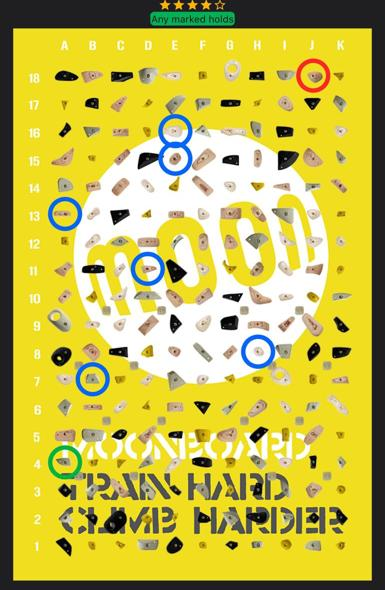

In [2]:
from IPython.display import Image, display

# Sostituisci il percorso con quello della tua immagine
display(Image(filename='C:/Users/fra24/OneDrive/Documenti/uni/magistrale/tesi/immagine_modificata.jpg'))

In [2]:
df = pd.read_csv('C:/Users/Francesco/Documents/uni/tesi/data_expl_analysis/moon_stima.csv', encoding='utf-8')
df.shape

(47604, 378)

In [3]:
# Suddividi le variabili in qualitative e quantitative per df
qualitative_vars = df.select_dtypes(include=["object", "category", "bool"]).columns.tolist()
quantitative_vars = df.select_dtypes(include=["number"]).columns.tolist()
print("Qualitative vars:", qualitative_vars)
print("Quantitative vars:", quantitative_vars)

Qualitative vars: ['grade', 'grade_v', 'isBenchmark', 'holdsets']
Quantitative vars: ['A5', 'A6', 'A9', 'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A18', 'B3', 'B4', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'B13', 'B15', 'B16', 'B18', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C18', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D16', 'D17', 'D18', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E18', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'G2', 'G4', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 'G17', 'G18', 'H5', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'H18', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I18', 'J2', 'J5', 'J6', 'J7', 'J8', 'J9', 'J10', 'J11', 'J12', 'J13', 'J14', 'J16', 'K5', 'K6', 'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14

Divisione variabili qualitative e quantitative:

In [4]:
# Trasforma in qualitative tutte le quantitative con <=5 valori distinti
quantitative_to_categorical = [col for col in quantitative_vars if df[col].nunique() <= 5]
for col in quantitative_to_categorical:
    df[col] = df[col].astype(str).astype('category')
    # Aggiungi la categoria 'unknown' se non presente
    if 'unknown' not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories(['unknown'])
        # (Non viene assegnato nessun valore 'unknown' ora, ma la categoria è pronta)
    
# Aggiorna gli elenchi delle variabili
qualitative_vars = df.select_dtypes(include=["object", "category", "bool"]).columns.tolist()
quantitative_vars = df.select_dtypes(include=["number"]).columns.tolist()
print("Nuove qualitative:", qualitative_vars)
print("Nuove quantitative:", quantitative_vars)
print("Variabili convertite in qualitative:", quantitative_to_categorical)

Nuove qualitative: ['grade', 'grade_v', 'isBenchmark', 'holdsets', 'A5', 'A6', 'A9', 'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A18', 'B3', 'B4', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'B13', 'B15', 'B16', 'B18', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C18', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D16', 'D17', 'D18', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E18', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'G2', 'G4', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 'G17', 'G18', 'H5', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'H18', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I18', 'J2', 'J5', 'J6', 'J7', 'J8', 'J9', 'J10', 'J11', 'J12', 'J13', 'J14', 'J16', 'K5', 'K6', 'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K16', 'K18', 'd

Seleziono sono alcune varibaili quantitative:

In [5]:
# Elenco delle variabili quantitative di interesse per analisi esplorative
explorative_vars = ['totale', 'centroide_y', 'centroide_x', 'var_y', 'var_x',
    'sim_vert', 'sim_oriz', 'diag_1', 'diag_2', 'media_loc_u_3_mean', 'media_loc_u_3_std',
    'media_loc_u_5_mean', 'media_loc_u_5_std', 'media_loc_g_mean', 'media_loc_g_std', 'media_loc_l_std',
    'colonne_usate', 'righe_usate', 'skew_y', 'skew_x', 'entropy', 'n_clusters',
    'mean_cluster_size', 'max_cluster_size', 'clusters_per_hold', 'max_density_3x3',
    'bbox_h', 'bbox_w', 'aspect_ratio', 'switch_righe', 'switch_colonne'
]

In [6]:
grade_order = [
    '6B', '6B+', '6C', '6C+', '7A', '7A+', '7B', '7B+', '7C', '7C+',
    '8A', '8A+', '8B', '8B+'
]

grade_order_v = [
    'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14'
]
if 'grade' in df.columns:
    df['grade'] = pd.Categorical(df['grade'], categories=grade_order, ordered=True)

if 'grade_v' in df.columns:
    df['grade_v'] = pd.Categorical(df['grade_v'], categories=grade_order_v, ordered=True)

### Variabili qualitative:

In [7]:
qual1 = ['isBenchmark', 'holdsets']

,Percentuale (%)
isBenchmark,
False,99.15
True,0.85


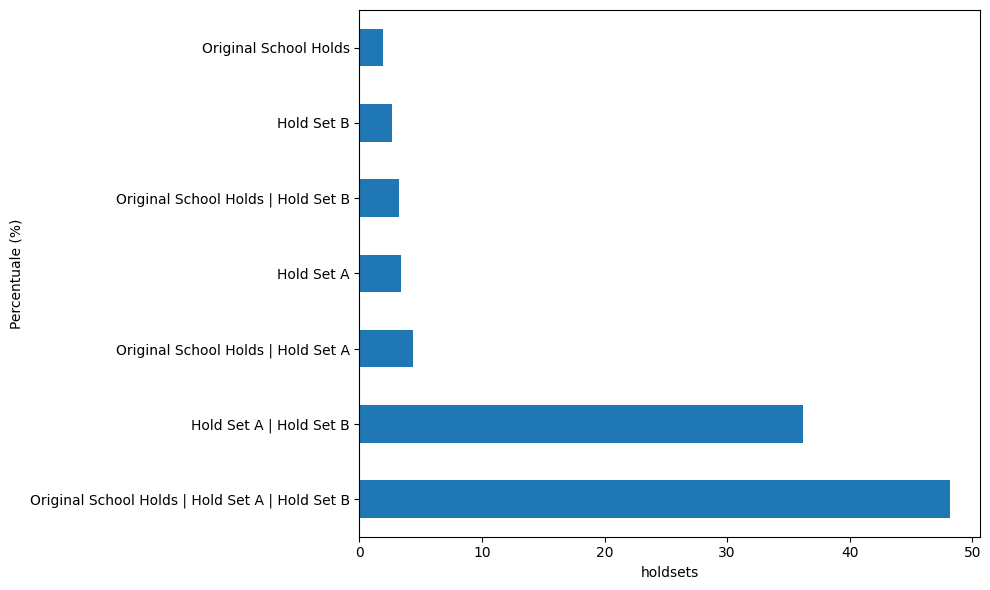

In [8]:
# Grafico 1: Distribuzione percentuale di isBenchmark
freq_table = (df["isBenchmark"].value_counts(normalize=True) * 100).round(2)
display(freq_table.to_frame("Percentuale (%)"))

# Grafico 2: Distribuzione percentuale delle categorie di holdsets
plt.figure(figsize=(10, 6))
(df["holdsets"].value_counts(normalize=True) * 100).plot(kind="barh")
#plt.title("Distribuzione percentuale delle categorie di holdsets")
plt.ylabel("Percentuale (%)")
plt.xlabel("holdsets")
plt.tight_layout()
plt.show()

C:\Users\Francesco\AppData\Local\Temp\ipykernel_24748\2195380089.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['holdsets', 'grade_v']).size().unstack(fill_value=0)


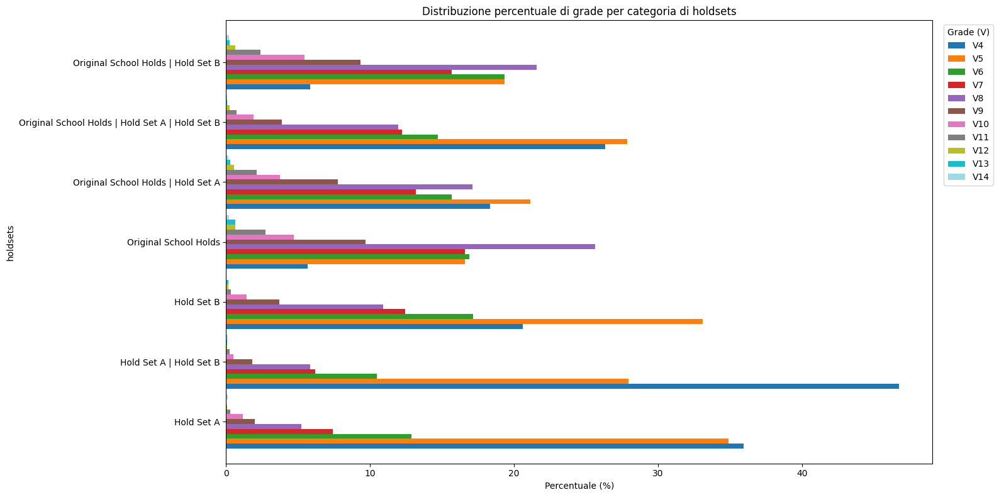

In [ ]:
# Barplot (non stacked) delle percentuali di grade per ogni categoria di holdsets

if 'holdsets' in df.columns and 'grade_v' in df.columns:
    counts = df.groupby(['holdsets', 'grade_v']).size().unstack(fill_value=0)
    perc = counts.div(counts.sum(axis=1), axis=0) * 100

    # Per ogni grade, crea un barplot affiancato (grouped barplot)
    ax = perc.plot(
        kind='barh',
        stacked=False,
        figsize=(16, 8),
        colormap='tab20',
        width=0.9
    )
    plt.title("Distribuzione percentuale di grade (V) di holdsets")
    plt.ylabel('holdsets')
    plt.xlabel('Percentuale (%)')
    plt.legend(title='Grade (V)', bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

<Axes: ylabel='isBenchmark'>

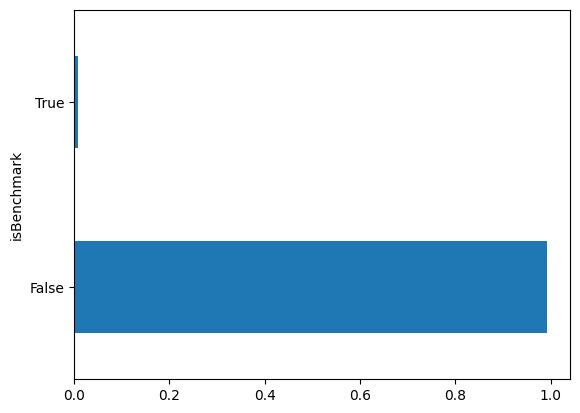

In [14]:
(df["isBenchmark"].value_counts() / df.shape[0]).round(4).plot(kind="barh")

### Prese:

In [15]:
holds = ['A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A17', 'A18', 
         'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'B13', 'B14', 'B15', 'B16', 'B17', 'B18', 
         'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 
         'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D16', 'D17', 'D18', 
         'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E17', 'E18', 
         'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F17', 'F18', 
         'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 'G17', 'G18', 
         'H1', 'H2', 'H3', 'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'H17', 'H18', 
         'I1', 'I2', 'I3', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I17', 'I18', 
         'J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9', 'J10', 'J11', 'J12', 'J13', 'J14', 'J15', 'J16', 'J17', 'J18', 
         'K1', 'K2', 'K3', 'K4', 'K5', 'K6', 'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K15', 'K16', 'K17', 'K18']

In [16]:
# Rimuovi dalla lista holds tutte le variabili con una sola modalità

holds_nonconstant = [col for col in holds if col in df.columns and df[col].nunique() > 1]
print("Holds con più di una modalità:", holds_nonconstant)

Holds con più di una modalità: ['A5', 'A6', 'A9', 'A10', 'A11', 'A12', 'A13', 'A14', 'A15', 'A16', 'A18', 'B3', 'B4', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'B13', 'B15', 'B16', 'B18', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'C15', 'C16', 'C18', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'D16', 'D17', 'D18', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E18', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'G2', 'G4', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 'G17', 'G18', 'H5', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12', 'H13', 'H14', 'H15', 'H16', 'H18', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11', 'I12', 'I13', 'I14', 'I15', 'I16', 'I18', 'J2', 'J5', 'J6', 'J7', 'J8', 'J9', 'J10', 'J11', 'J12', 'J13', 'J14', 'J16', 'K5', 'K6', 'K7', 'K8', 'K9', 'K10', 'K11', 'K12', 'K13', 'K14', 'K16', 'K18']


Barplot: per ogni presa, mostra la distribuzione percentuale tra i grade SOLO sui blocchi dove la presa è usata (la somma fa 100%)

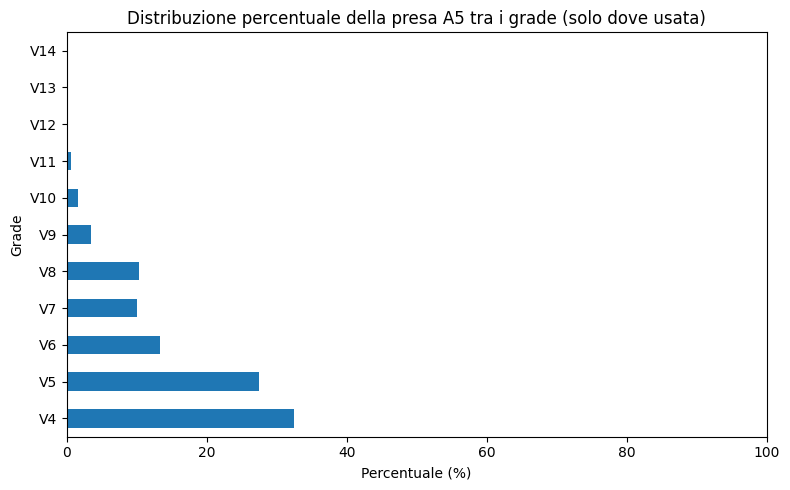

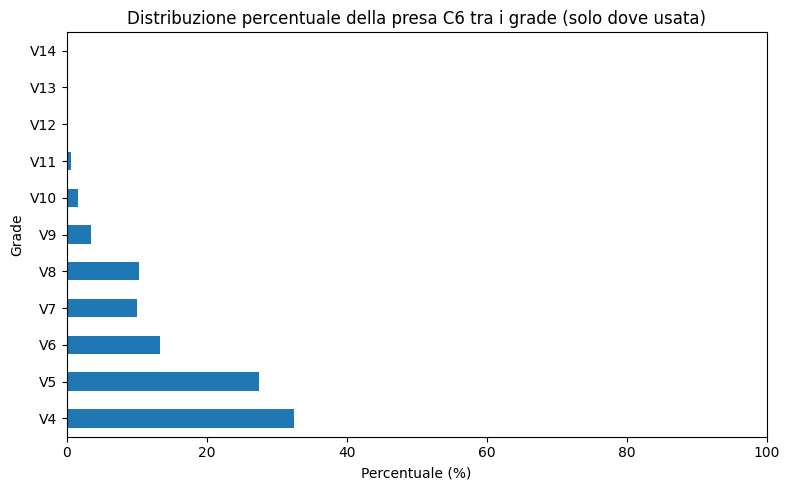

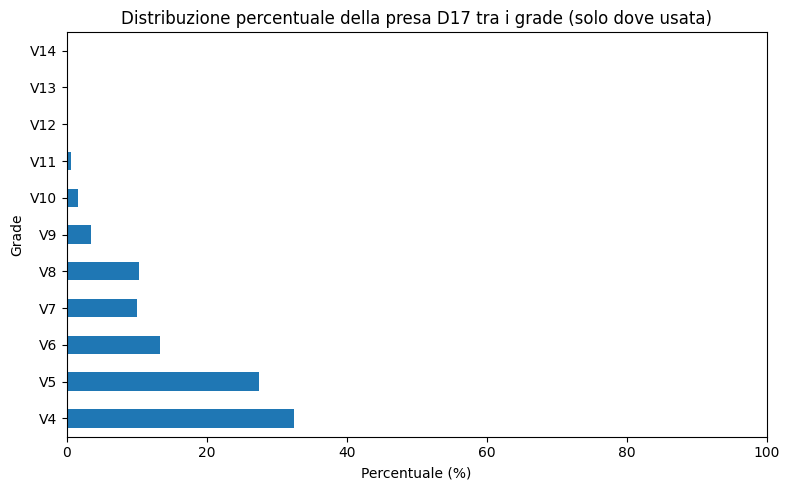

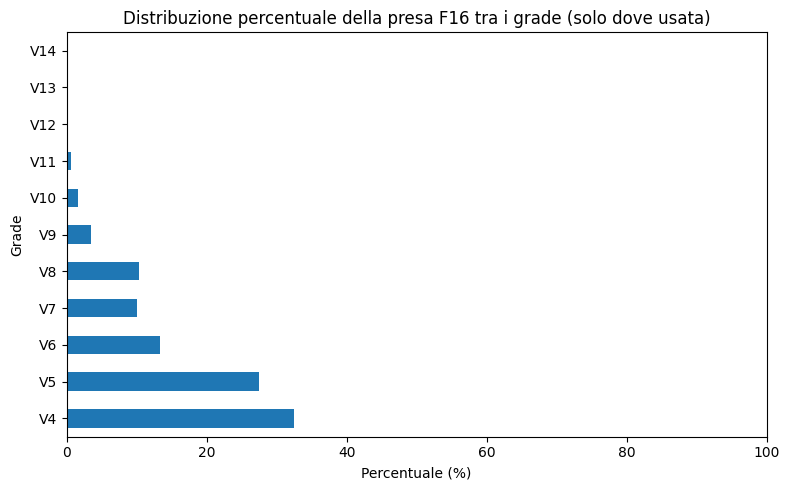

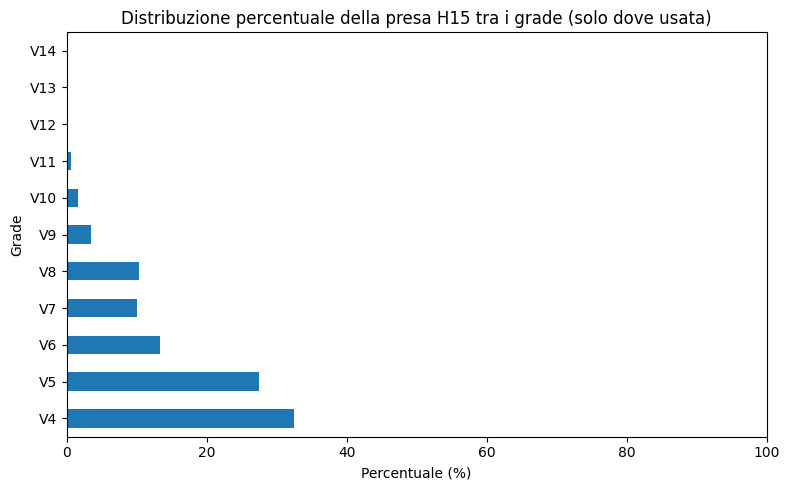

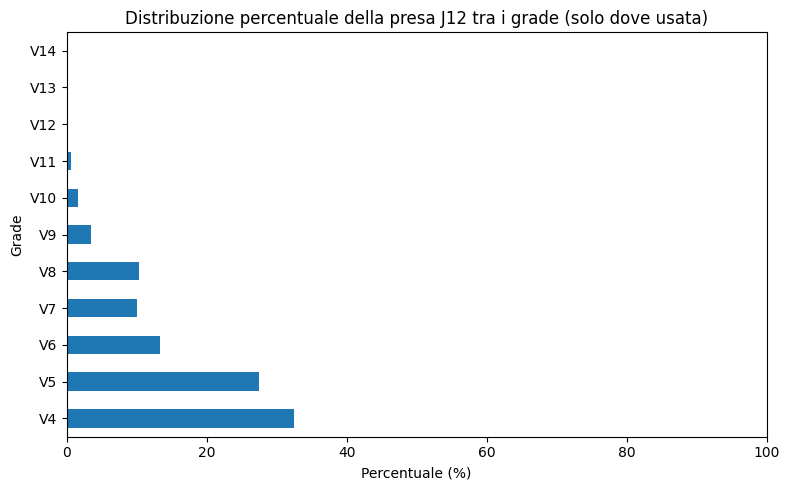

In [17]:
if 'grade_v' in df.columns:
    for i, var in enumerate(holds_nonconstant):
        if var in df.columns and i % 25 == 0:
            # Filtra solo i blocchi dove la presa è usata (diverso da zero)
            used = df[df[var] != 0]
            # Conta i blocchi per ogni grade dove la presa è usata
            counts = used.groupby('grade_v', observed=False).size()
            # Percentuale rispetto al totale di blocchi dove la presa è usata
            perc = (counts / counts.sum() * 100).reindex(df['grade_v'].cat.categories)

            ax = perc.plot(
                kind='barh',
                figsize=(8, 5),
                color='tab:blue'
            )
            plt.title(f"Distribuzione percentuale della presa {var} tra i grade (solo dove usata)")
            plt.xlabel('Percentuale (%)')
            plt.ylabel('Grade')
            plt.xlim(0, 100)
            plt.tight_layout()
            plt.show()


--- totale ---


,totale
count,47604.000000
mean,7.564343
std,1.821706
min,3.000000
25%,6.000000
50%,7.000000
75%,8.000000
max,26.000000


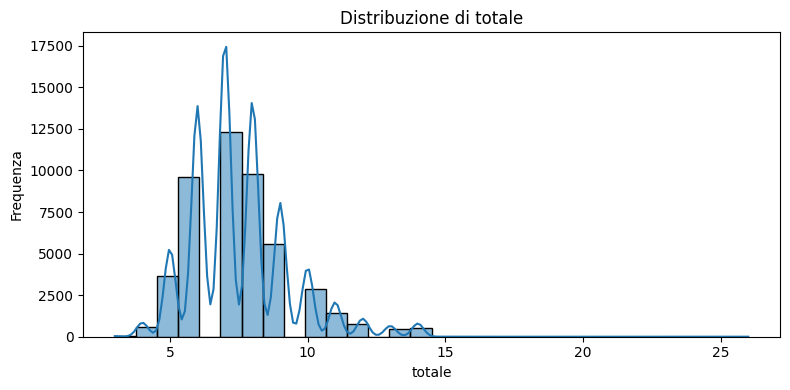


--- centroide_y ---


,centroide_y
count,47604.000000
mean,8.773824
std,2.299959
min,0.666667
25%,7.200000
50%,8.750000
75%,10.333333
max,16.833333


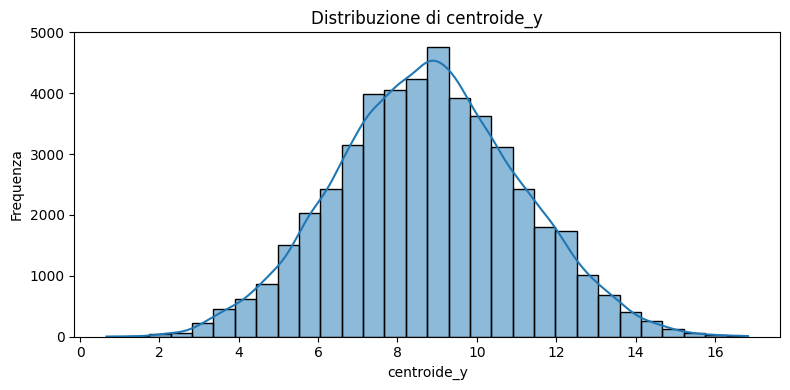


--- centroide_x ---


,centroide_x
count,47604.000000
mean,4.996304
std,1.115430
min,0.571429
25%,4.250000
50%,5.000000
75%,5.750000
max,9.400000


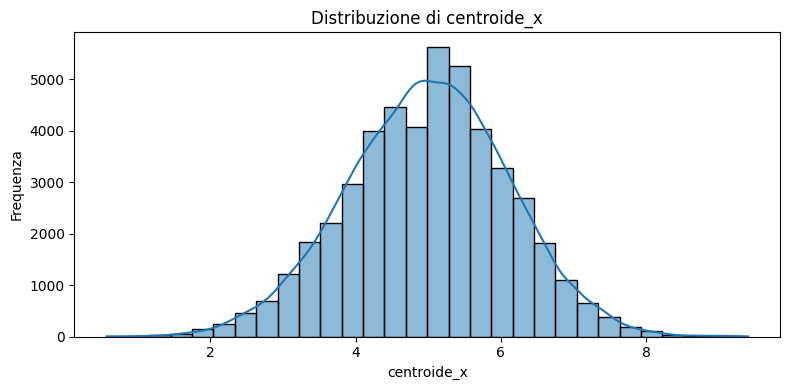


--- var_y ---


,var_y
count,47604.000000
mean,12.684169
std,7.685329
min,0.076389
25%,6.916667
50%,10.909091
75%,16.888889
max,68.187500


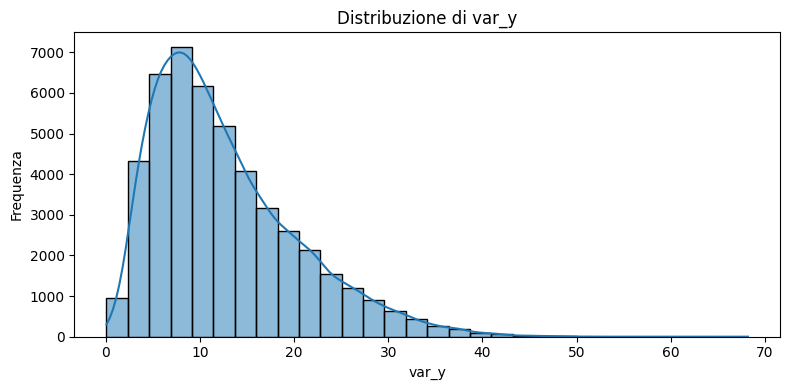


--- var_x ---


,var_x
count,47604.000000
mean,8.358167
std,3.295145
min,0.160000
25%,6.000000
50%,8.264463
75%,10.555556
max,21.918367


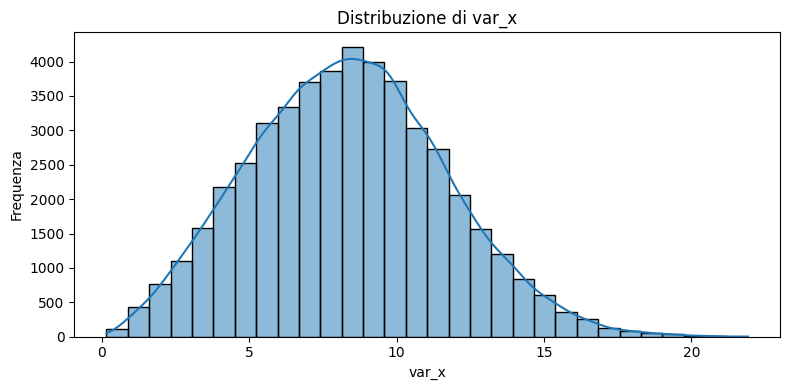


--- sim_vert ---


,sim_vert
count,47604.000000
mean,0.926749
std,0.020411
min,0.744444
25%,0.911111
50%,0.933333
75%,0.944444
max,0.988889


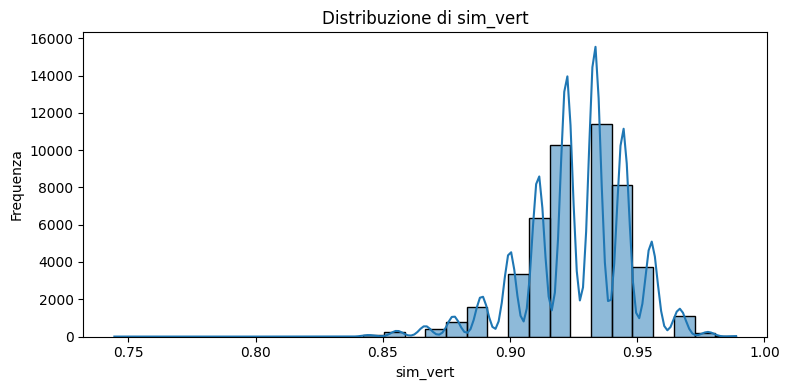


--- sim_oriz ---


,sim_oriz
count,47604.000000
mean,0.926496
std,0.018318
min,0.777778
25%,0.919192
50%,0.929293
75%,0.939394
max,0.989899


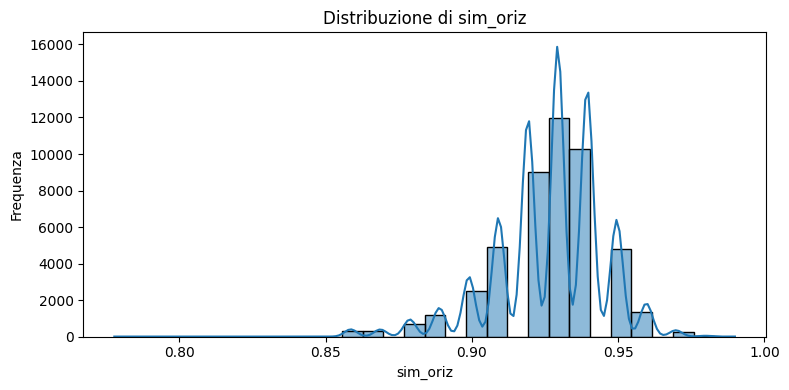


--- skew_y ---


,skew_y
count,47604.000000
mean,1.238237
std,0.531936
min,-1.336306
25%,0.943467
50%,1.245415
75%,1.539601
max,3.829525


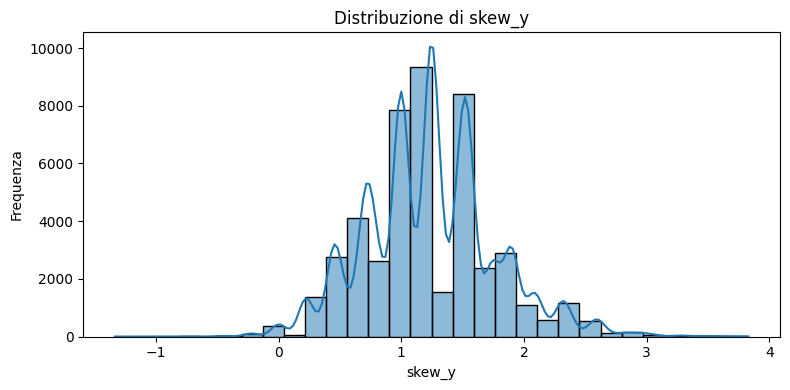


--- skew_x ---


,skew_x
count,47604.000000
mean,0.682040
std,0.563726
min,-2.846050
25%,0.296884
50%,0.726749
75%,1.020621
max,2.846050


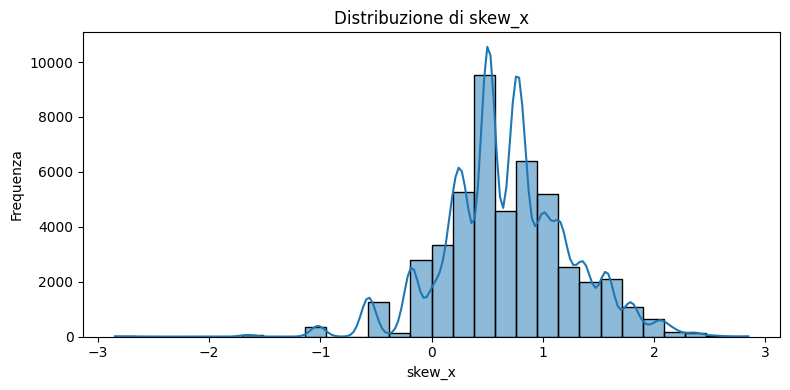


--- entropy ---


,entropy
count,47604.000000
mean,1.635682
std,0.245509
min,0.450561
25%,1.522955
50%,1.667462
75%,1.791759
max,2.397895


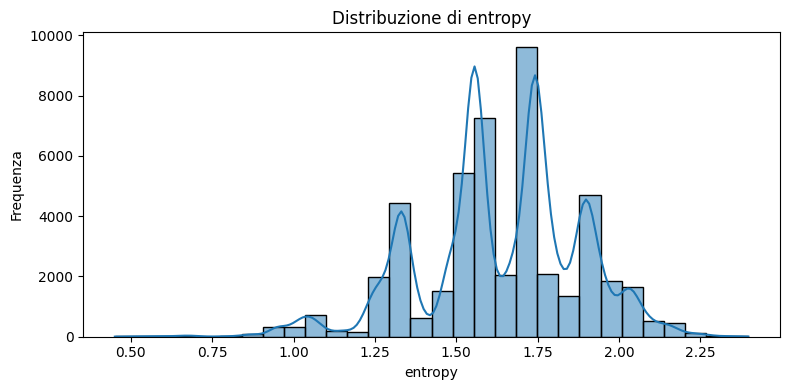


--- n_clusters ---


,n_clusters
count,47604.000000
mean,7.082493
std,1.638757
min,1.000000
25%,6.000000
50%,7.000000
75%,8.000000
max,18.000000


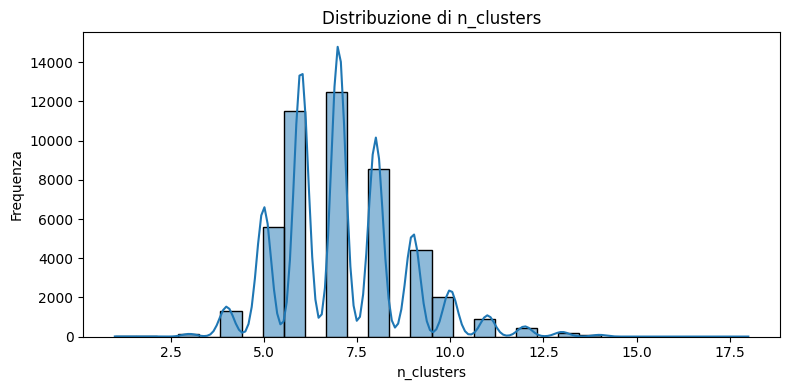


--- mean_cluster_size ---


,mean_cluster_size
count,47604.000000
mean,1.074176
std,0.181077
min,1.000000
25%,1.000000
50%,1.000000
75%,1.142857
max,14.000000


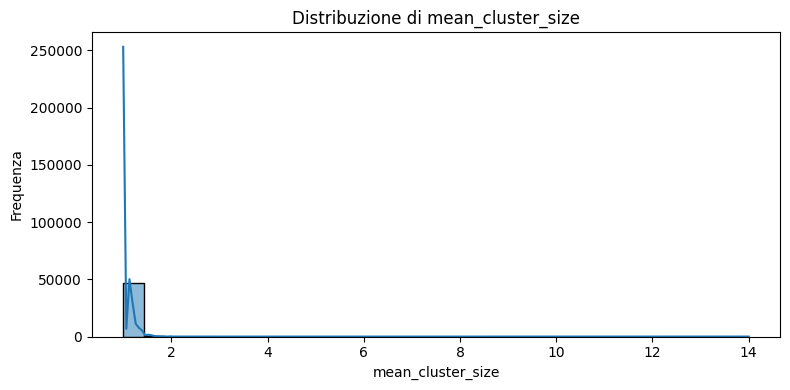


--- max_cluster_size ---


,max_cluster_size
count,47604.000000
mean,1.406941
std,0.621931
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,14.000000


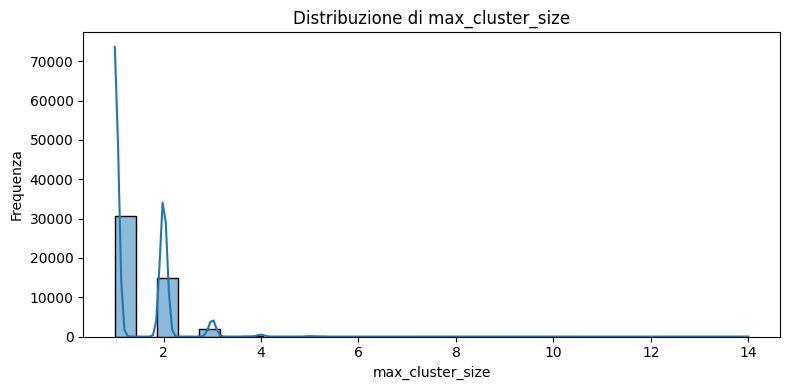


--- clusters_per_hold ---


,clusters_per_hold
count,47604.000000
mean,0.942155
std,0.088849
min,0.071429
25%,0.875000
50%,1.000000
75%,1.000000
max,1.000000


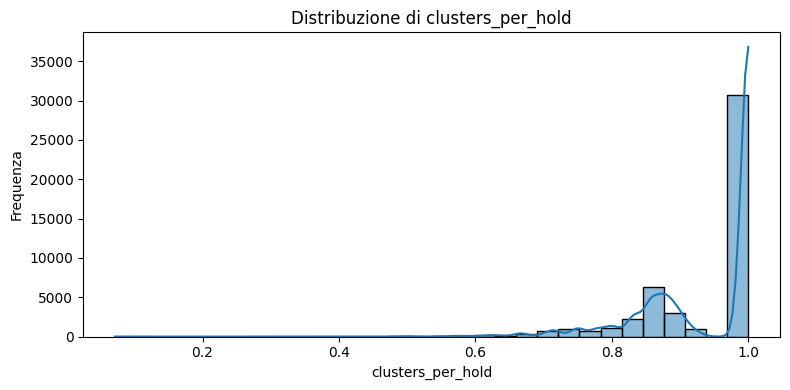


--- max_density_3x3 ---


,max_density_3x3
count,47604.000000
mean,2.286930
std,0.618868
min,1.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,8.000000


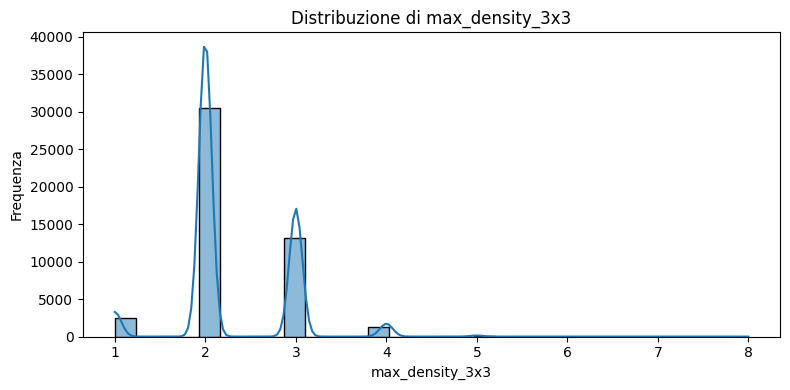


--- bbox_h ---


,bbox_h
count,47604.000000
mean,11.163096
std,3.231867
min,2.000000
25%,9.000000
50%,11.000000
75%,14.000000
max,18.000000


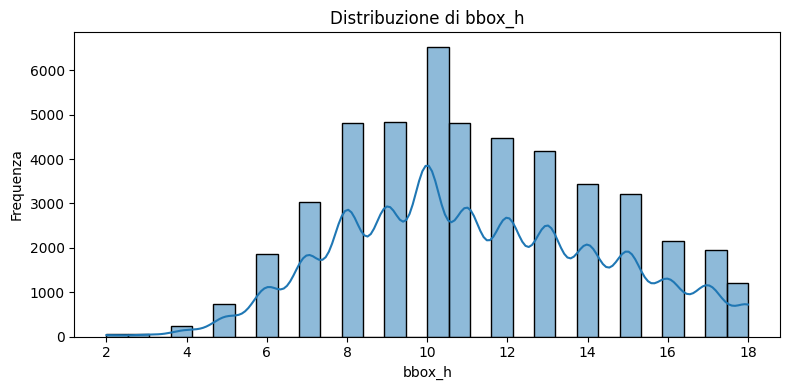


--- bbox_w ---


,bbox_w
count,47604.000000
mean,9.158264
std,1.630021
min,2.000000
25%,8.000000
50%,10.000000
75%,10.000000
max,11.000000


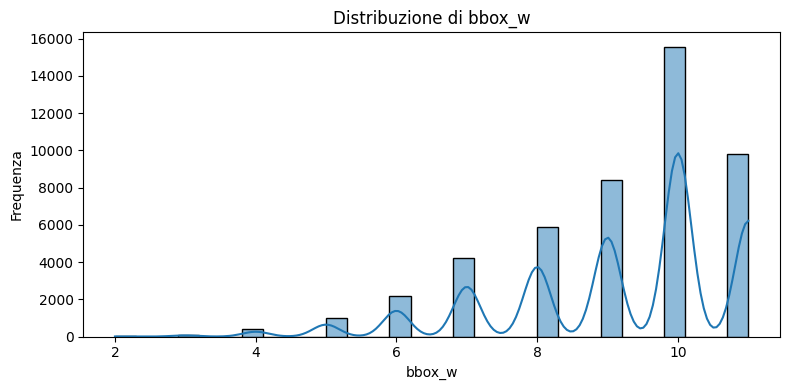


--- aspect_ratio ---


,aspect_ratio
count,47604.000000
mean,0.897741
std,0.356696
min,0.153846
25%,0.666667
50%,0.833333
75%,1.000000
max,5.500000


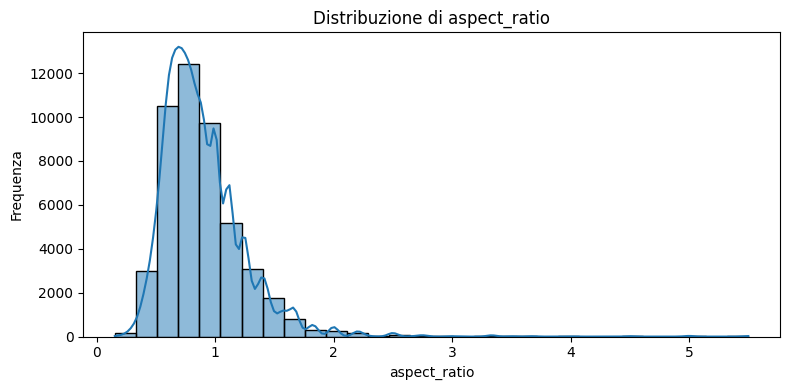


--- switch_righe ---


,switch_righe
count,47604.000000
mean,13.588732
std,3.278001
min,2.000000
25%,11.000000
50%,13.000000
75%,15.000000
max,32.000000


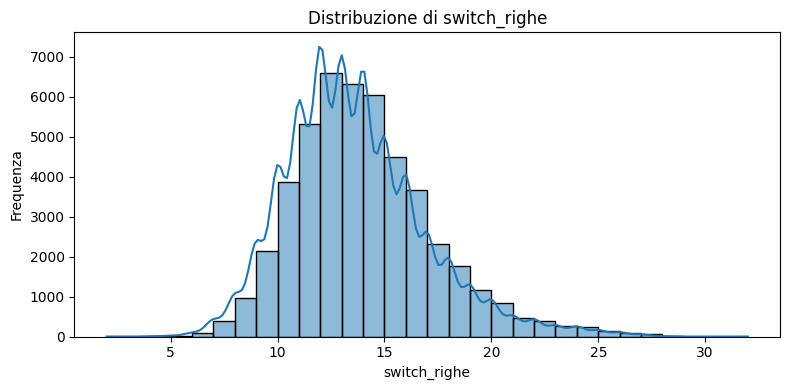


--- switch_colonne ---


,switch_colonne
count,47604.000000
mean,14.070498
std,3.355885
min,4.000000
25%,12.000000
50%,14.000000
75%,16.000000
max,50.000000


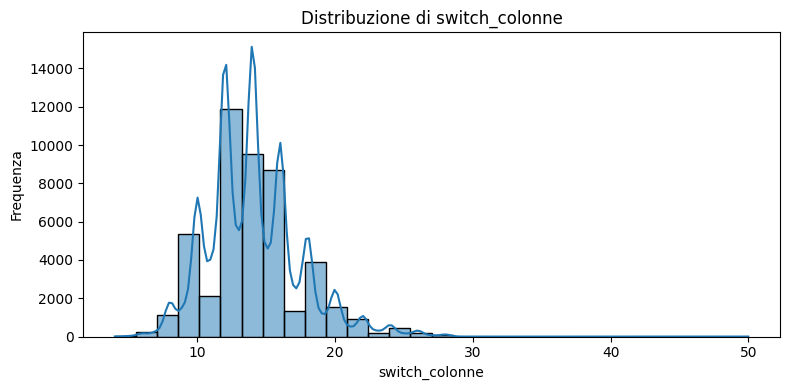

In [30]:
# Lista delle variabili da analizzare
vars_univariate = [
    'totale', 'centroide_y', 'centroide_x', 'var_y', 'var_x', 'sim_vert', 'sim_oriz',
    'skew_y', 'skew_x', 'entropy', 'n_clusters', 'mean_cluster_size', 'max_cluster_size',
    'clusters_per_hold', 'max_density_3x3', 'bbox_h', 'bbox_w', 'aspect_ratio',
    'switch_righe', 'switch_colonne'
]

for var in vars_univariate:
    if var in df.columns:
        print(f"\n--- {var} ---")
        display(df[var].describe().to_frame())
        plt.figure(figsize=(8, 4))
        sns.histplot(df[var], kde=True, bins=30)
        plt.title(f"Distribuzione di {var}")
        plt.xlabel(var)
        plt.ylabel("Frequenza")
        plt.tight_layout()
        plt.show()

### Boxplot variabili quantitative, discrimante da 'grade'

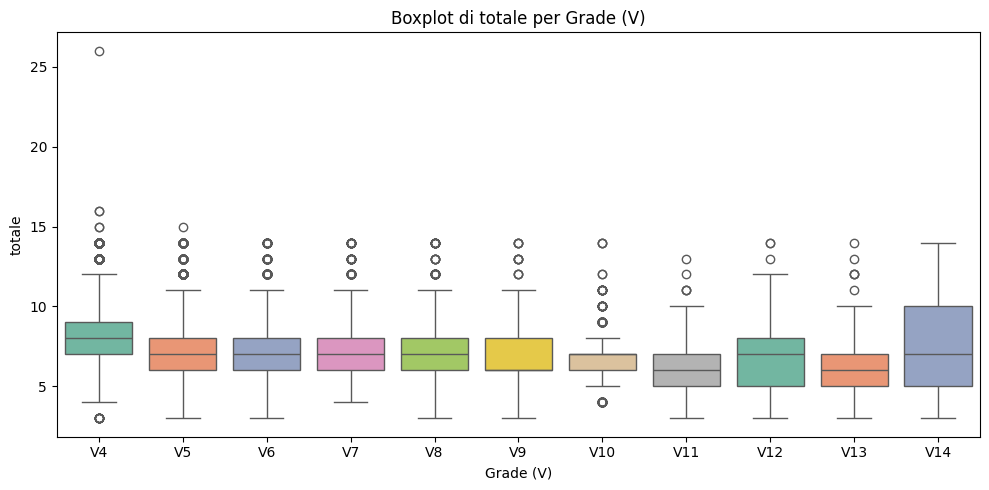

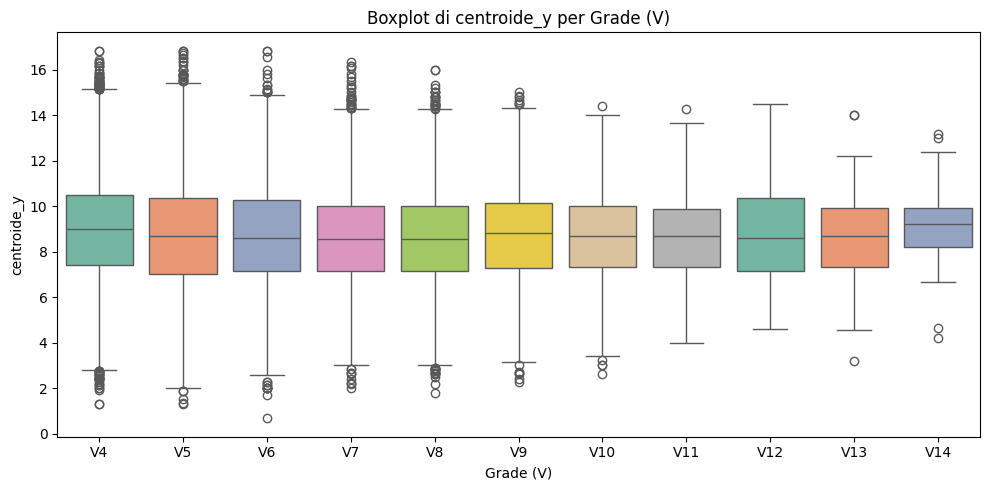

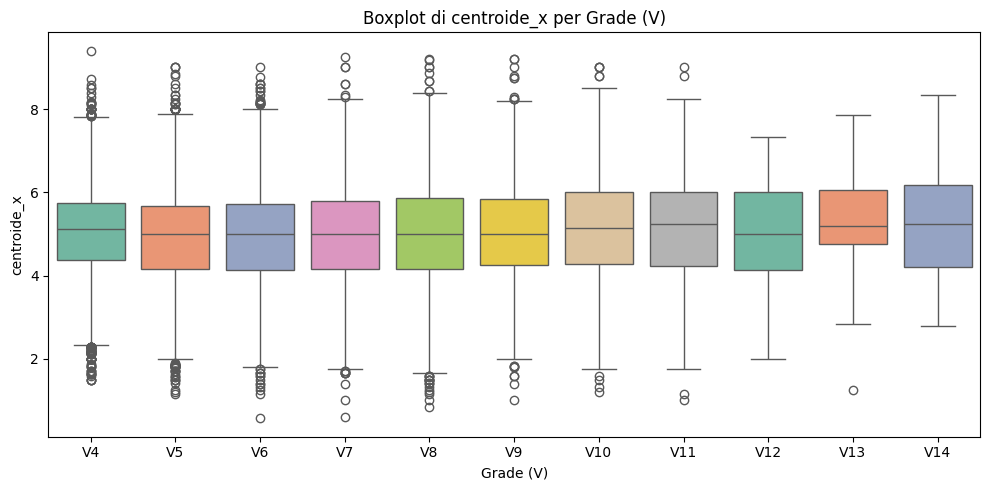

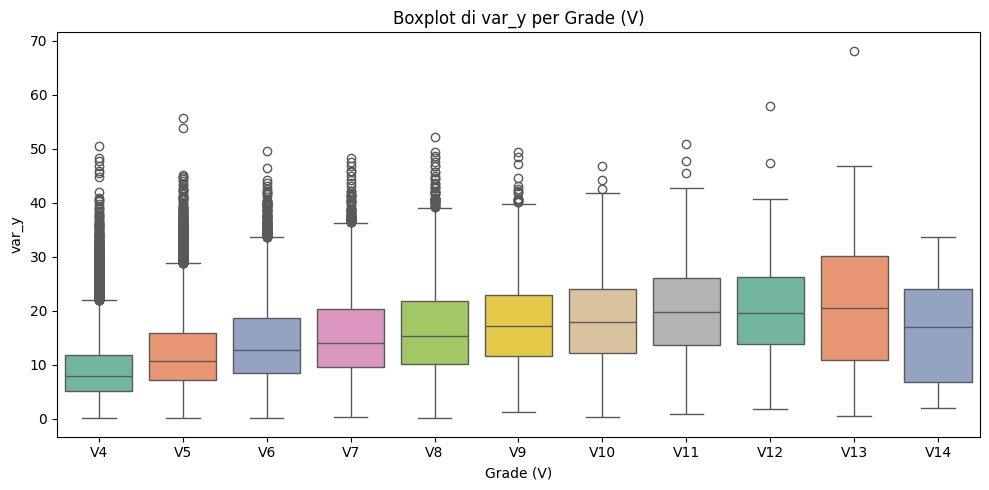

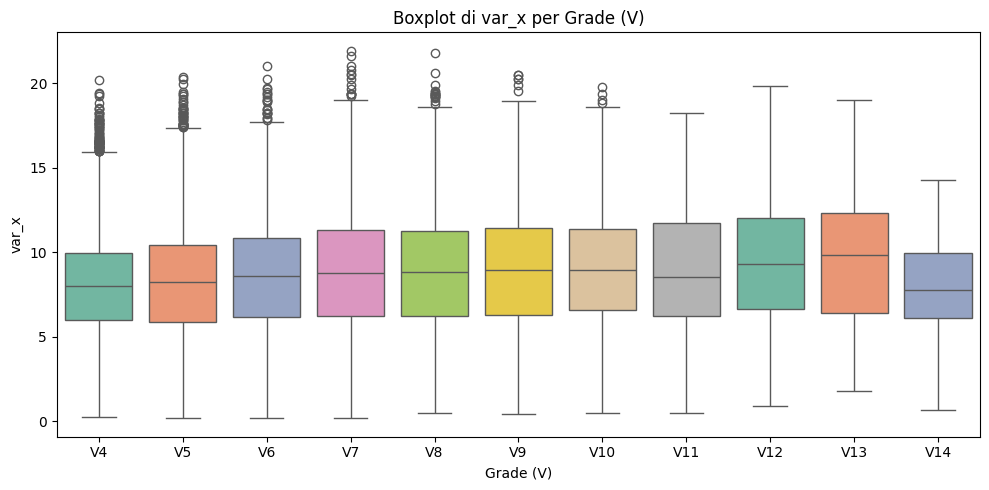

...

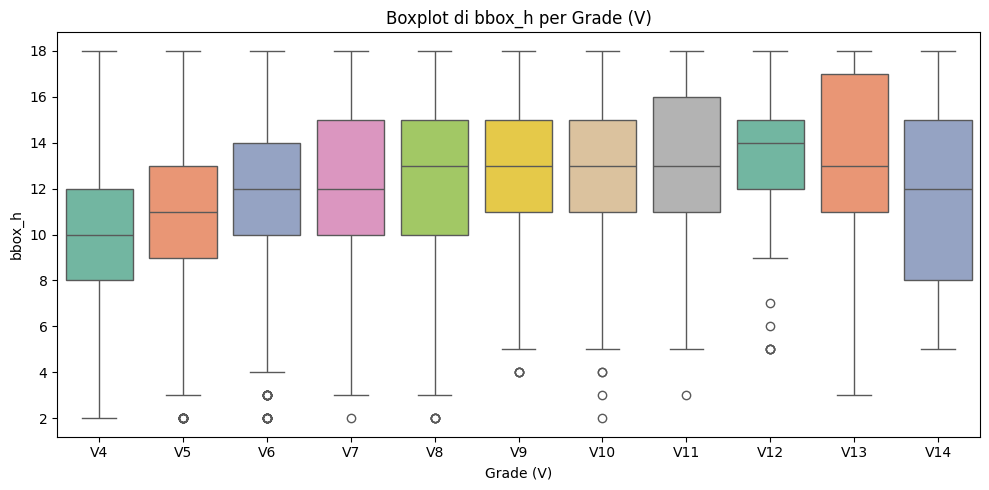

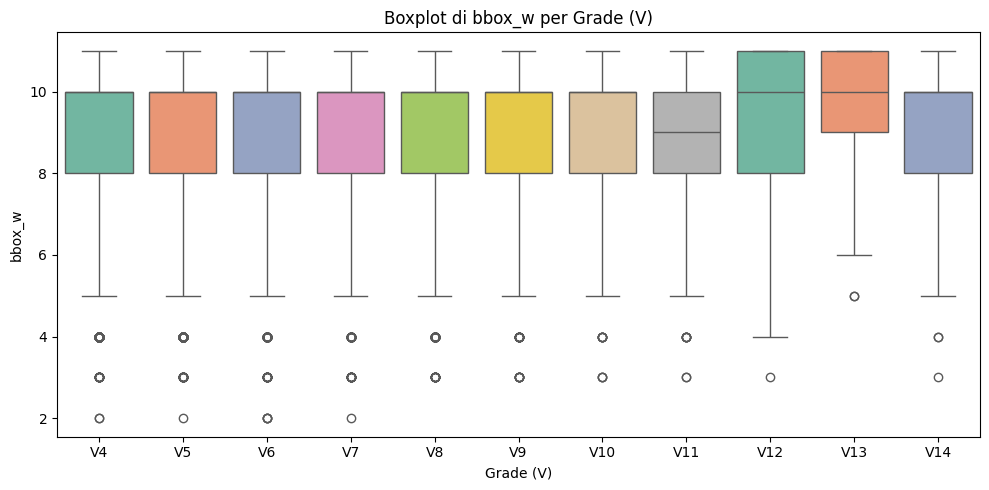

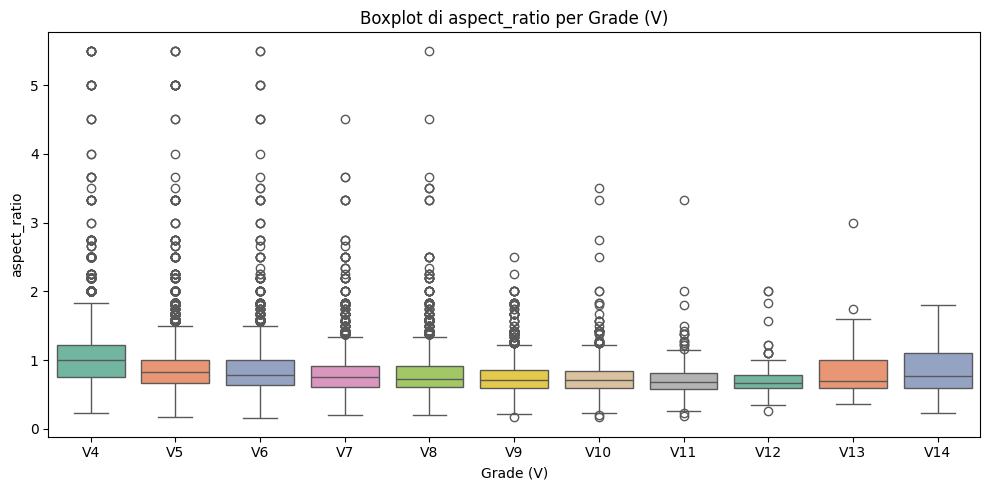

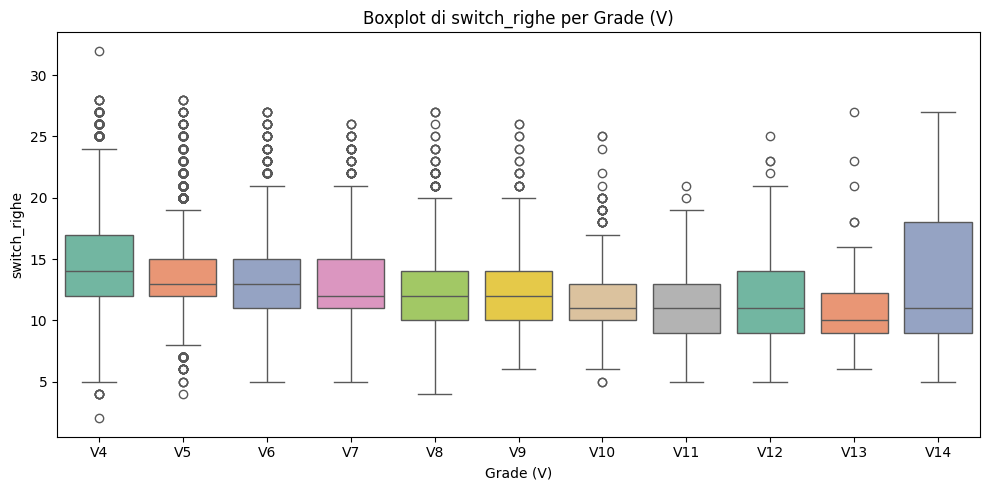

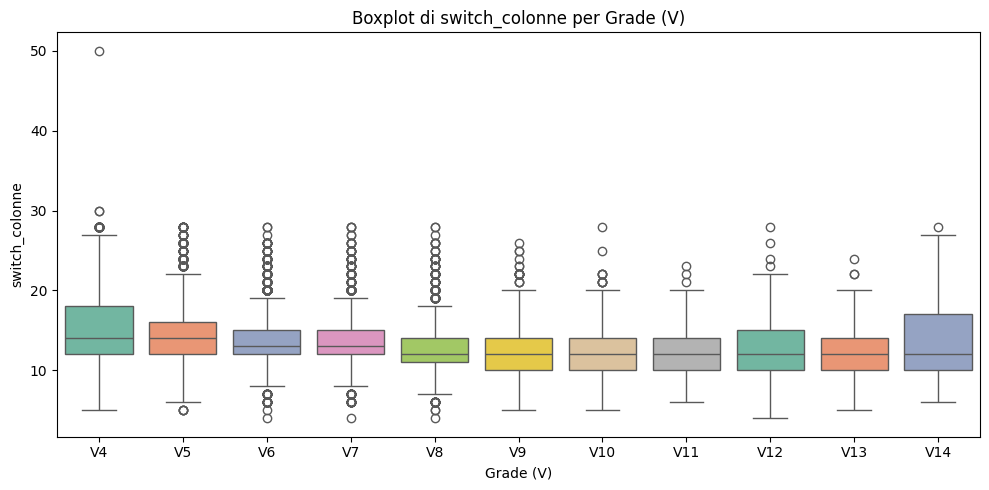

In [18]:
for var in explorative_vars:
    if var in df.columns and ('grade' in df.columns or 'grade_v' in df.columns):
        plt.figure(figsize=(10, 5))
        sns.boxplot(x='grade_v', y=var, data=df, hue='grade_v', palette="Set2", legend=False)
        plt.title(f'Boxplot di {var} per Grade (V)')
        plt.xlabel('Grade (V)')
        plt.ylabel(var)
        plt.tight_layout()
        plt.show()

### Ridgeline graph, sempre stesse var:

[SKIP] Variabile NON numerica o vuota: diag_1
[SKIP] Variabile NON numerica o vuota: diag_2


C:\Users\Francesco\AppData\Local\Temp\ipykernel_24748\2845329642.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 4))


<Figure size 800x400 with 0 Axes>

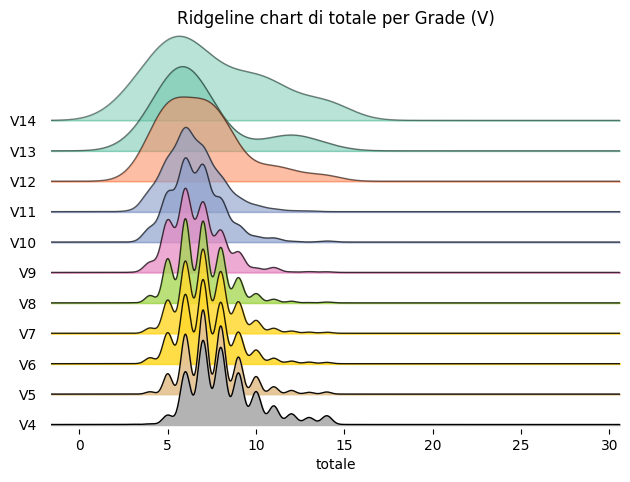

<Figure size 800x400 with 0 Axes>

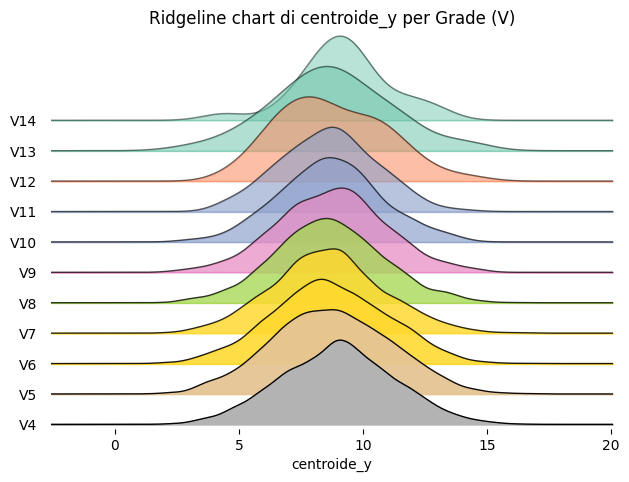

<Figure size 800x400 with 0 Axes>

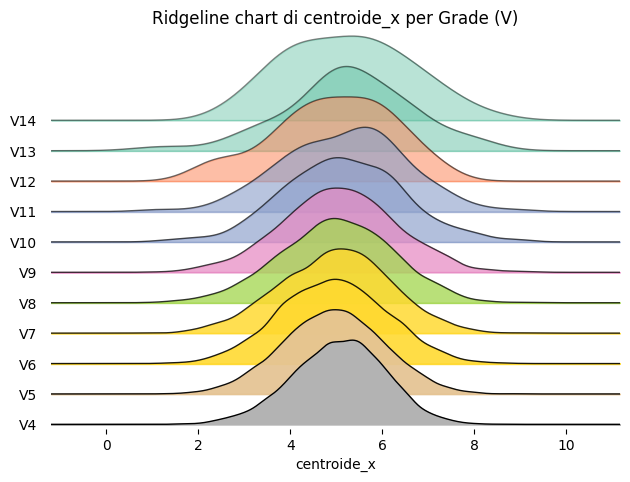

<Figure size 800x400 with 0 Axes>

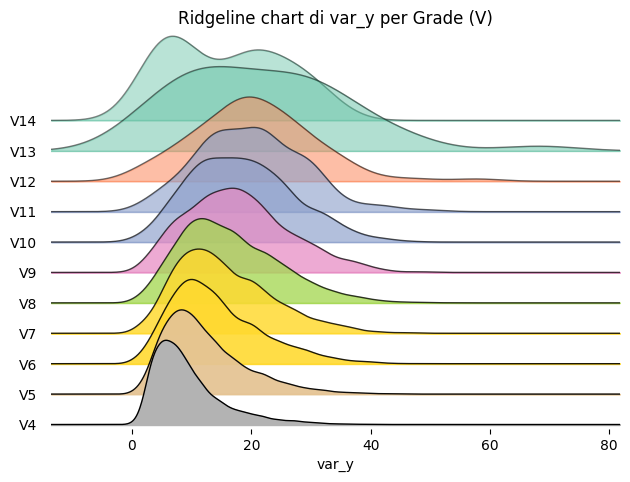

<Figure size 800x400 with 0 Axes>

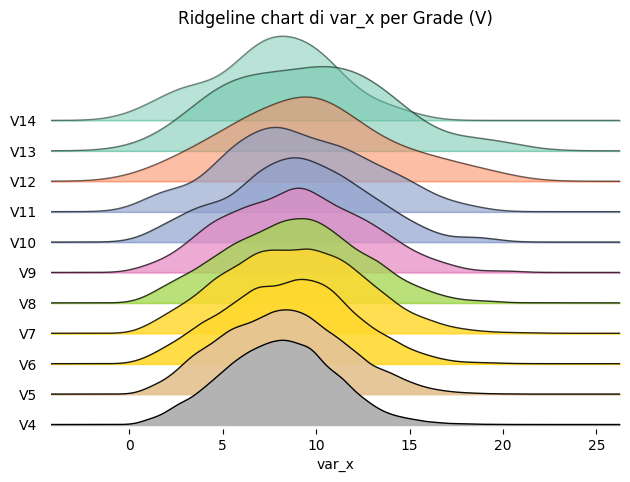

<Figure size 800x400 with 0 Axes>

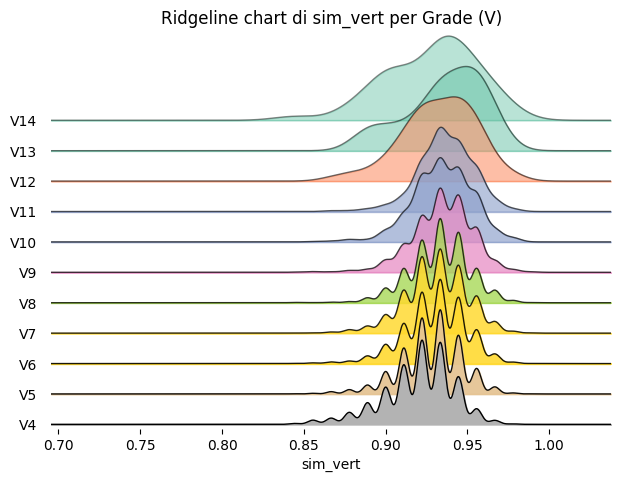

<Figure size 800x400 with 0 Axes>

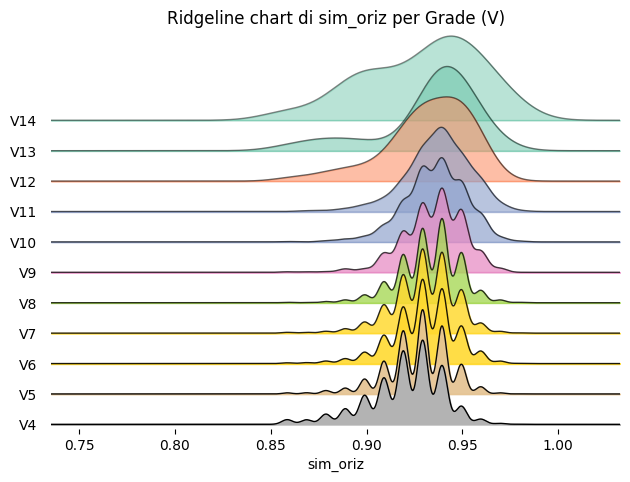

<Figure size 800x400 with 0 Axes>

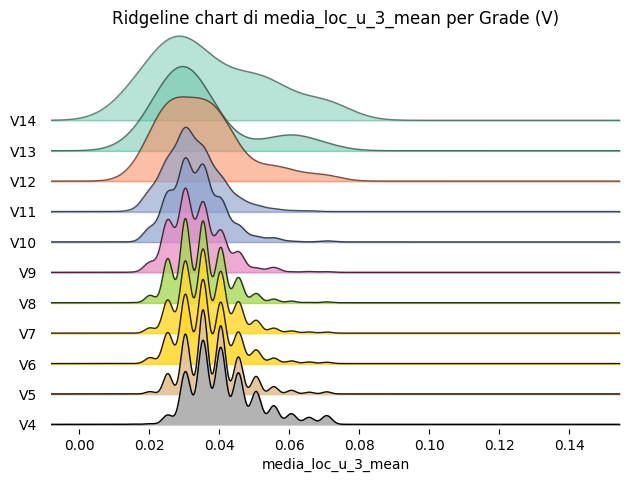

<Figure size 800x400 with 0 Axes>

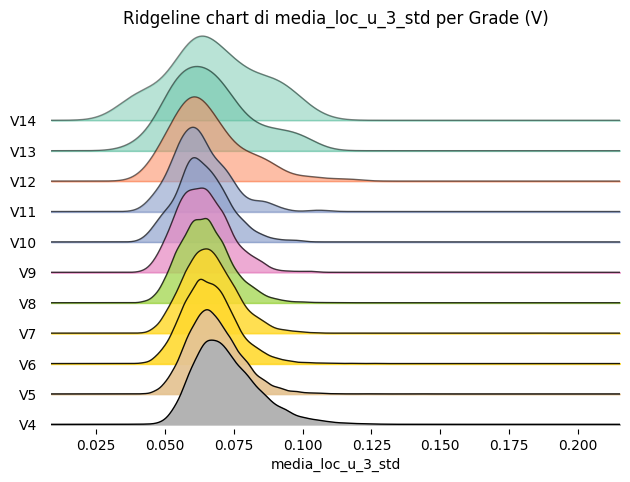

<Figure size 800x400 with 0 Axes>

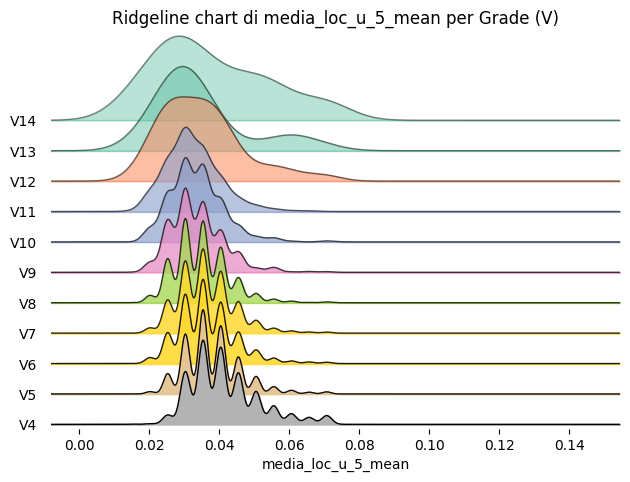

<Figure size 800x400 with 0 Axes>

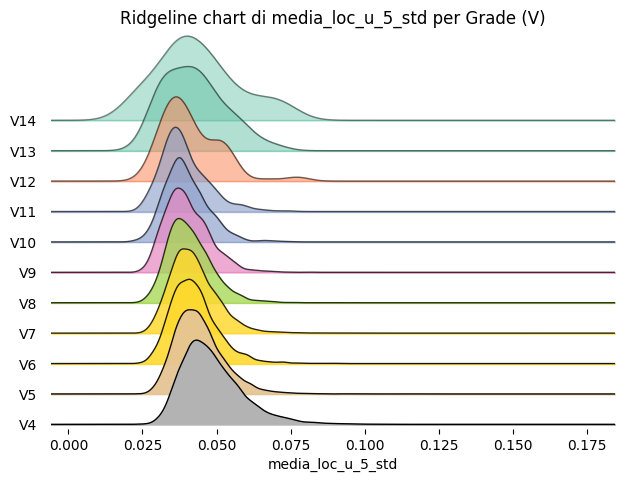

<Figure size 800x400 with 0 Axes>

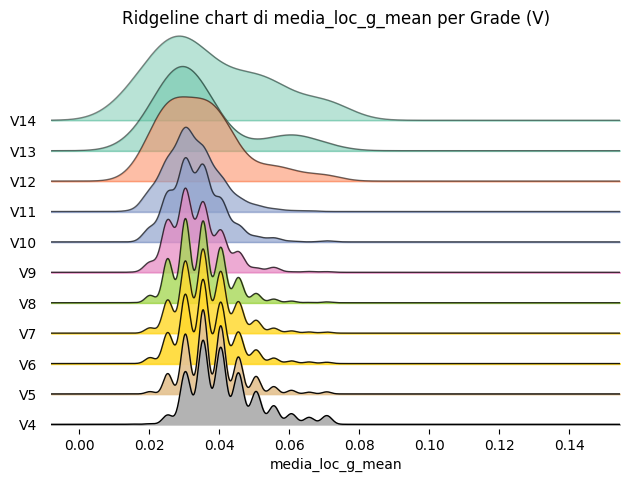

<Figure size 800x400 with 0 Axes>

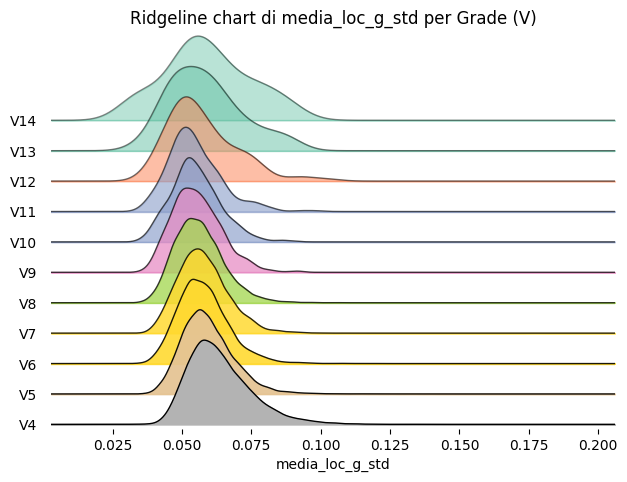

<Figure size 800x400 with 0 Axes>

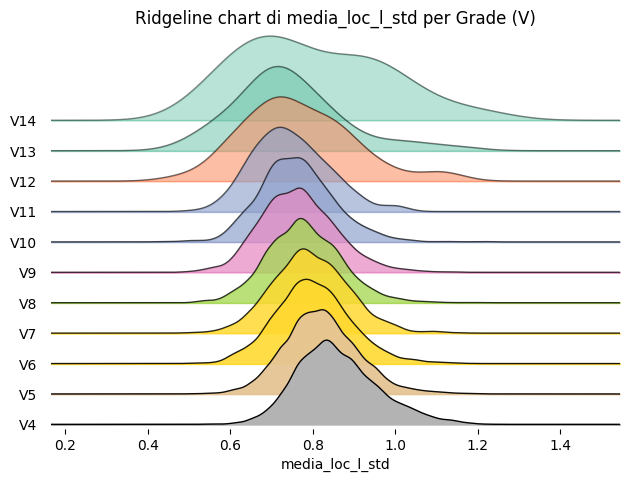

<Figure size 800x400 with 0 Axes>

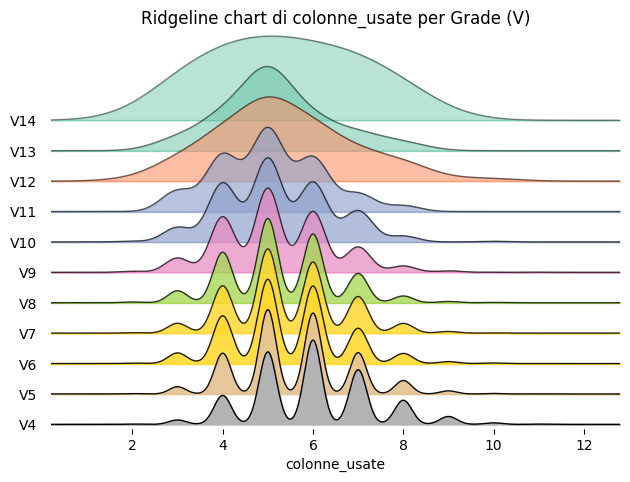

<Figure size 800x400 with 0 Axes>

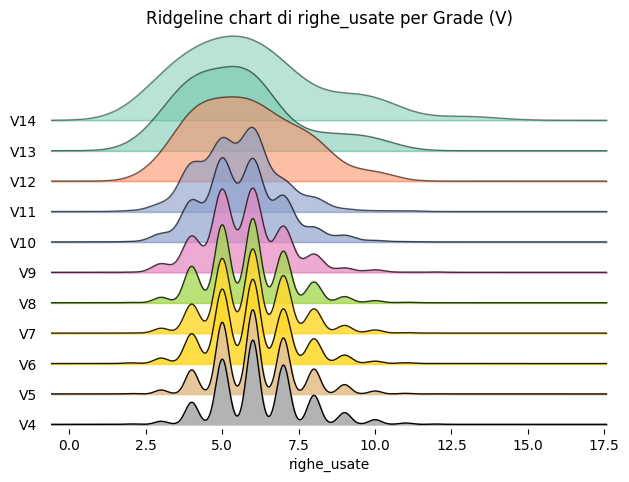

<Figure size 800x400 with 0 Axes>

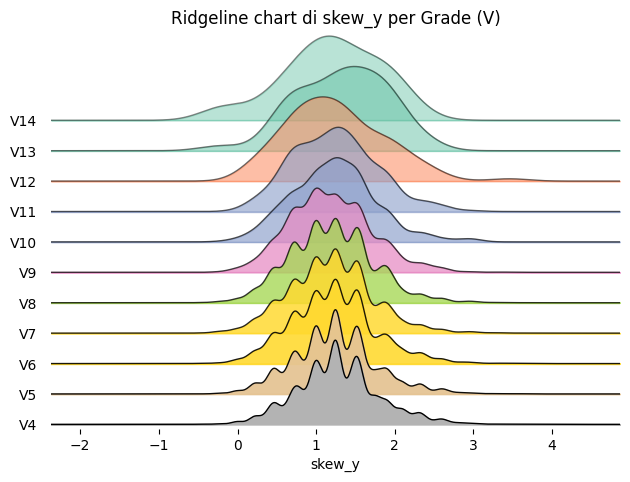

<Figure size 800x400 with 0 Axes>

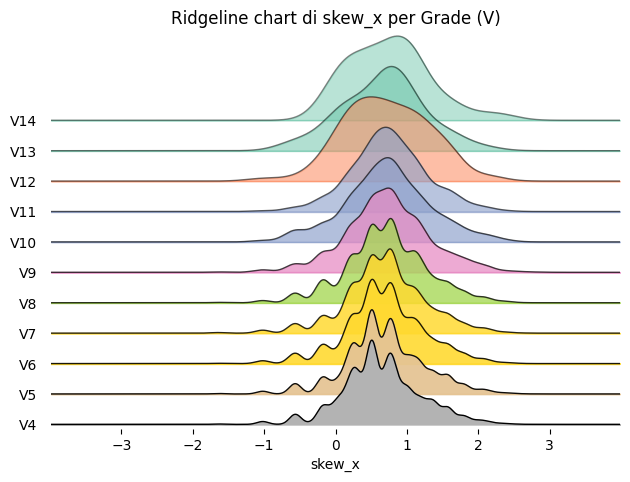

<Figure size 800x400 with 0 Axes>

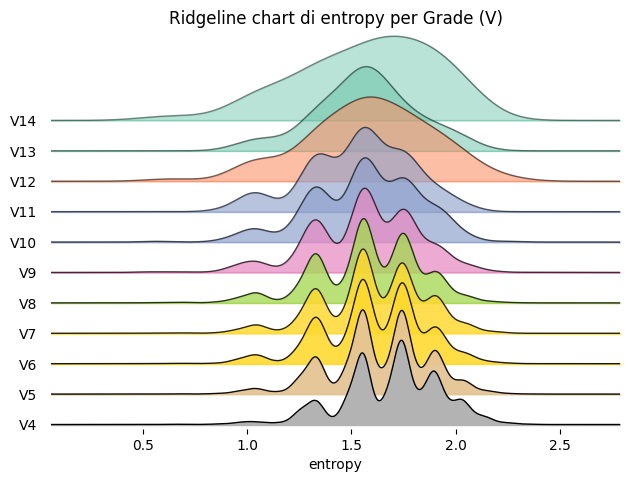

<Figure size 800x400 with 0 Axes>

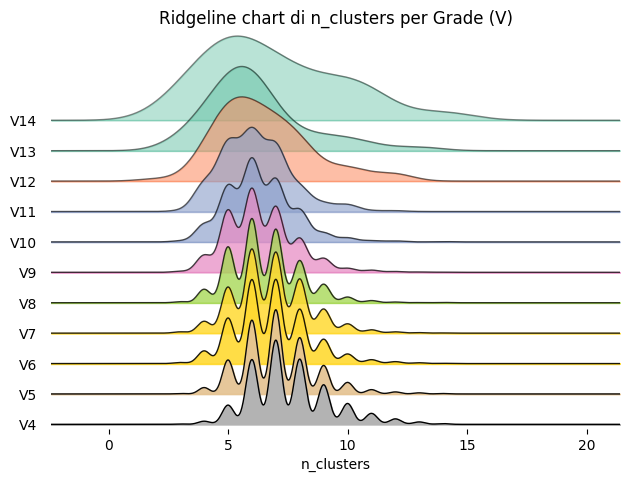

<Figure size 800x400 with 0 Axes>

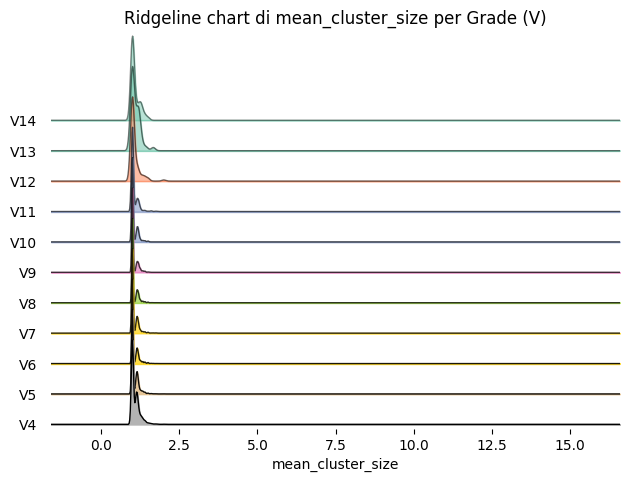

<Figure size 800x400 with 0 Axes>

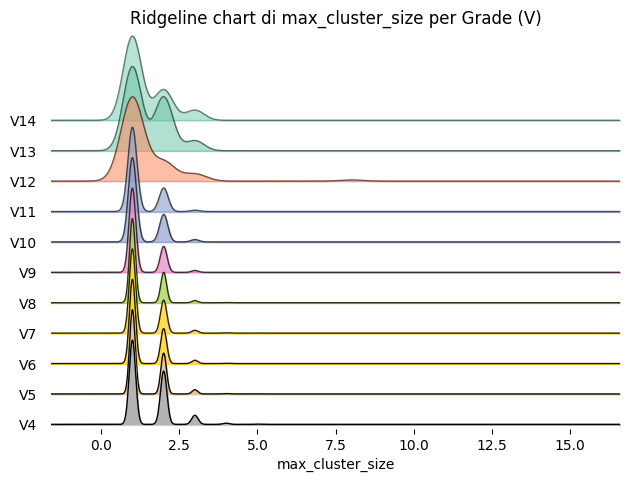

<Figure size 800x400 with 0 Axes>

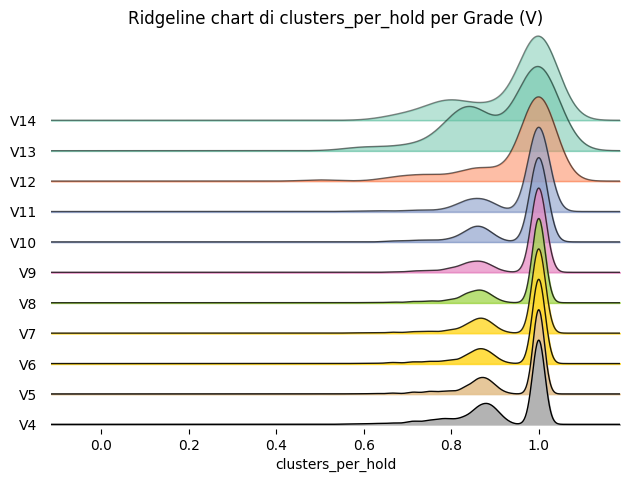

<Figure size 800x400 with 0 Axes>

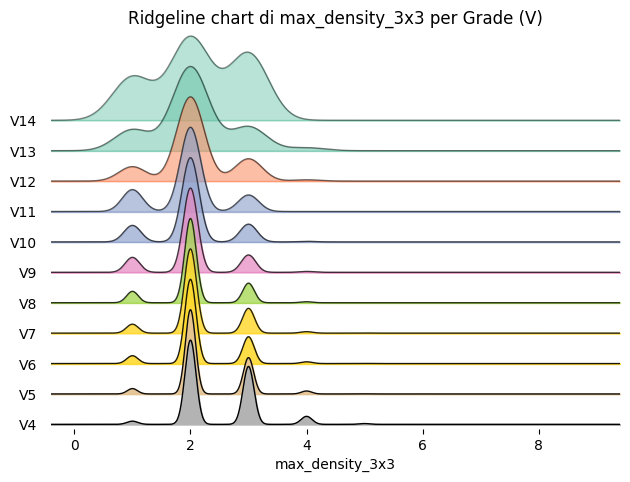

<Figure size 800x400 with 0 Axes>

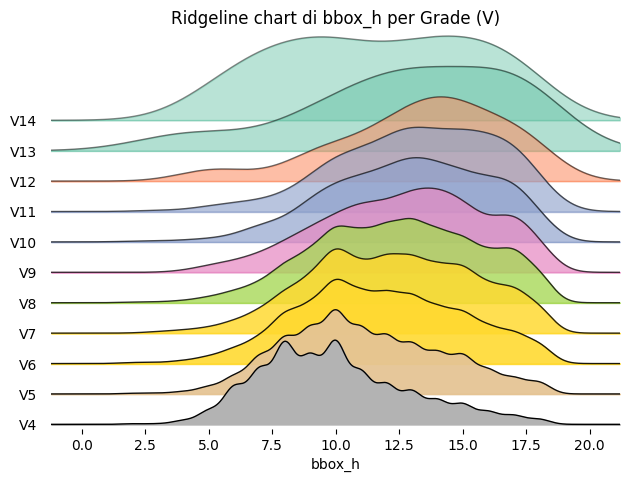

<Figure size 800x400 with 0 Axes>

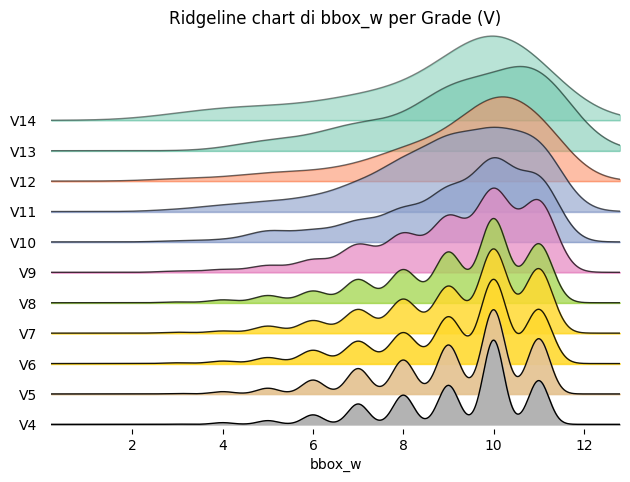

<Figure size 800x400 with 0 Axes>

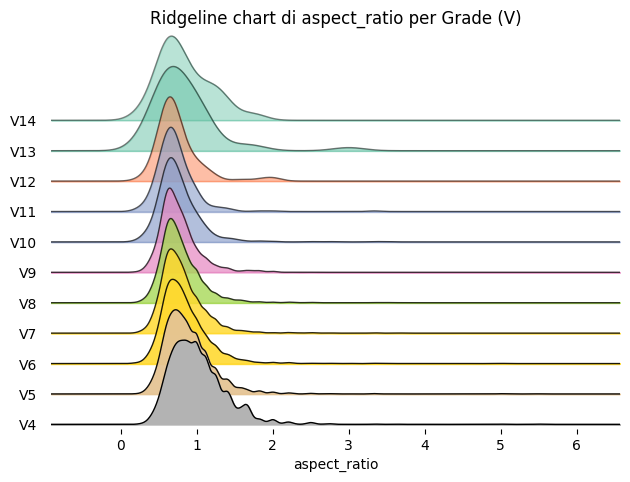

<Figure size 800x400 with 0 Axes>

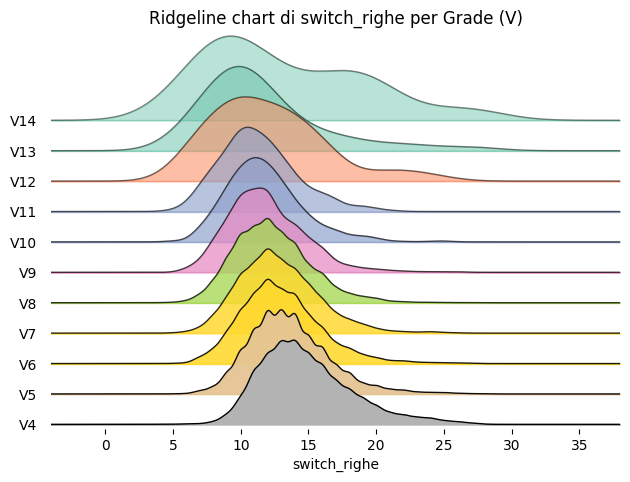

<Figure size 800x400 with 0 Axes>

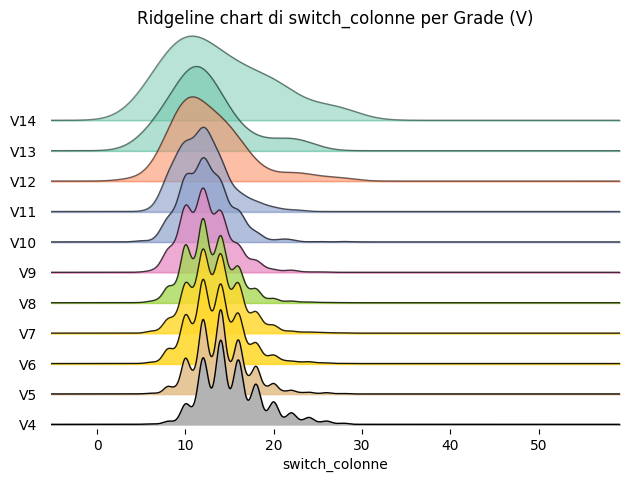

In [31]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import joypy

# Ordina la colonna 'grade' in modo decrescente (da 8B+ a 6B)
grade_order_desc = [
    '8B+', '8B', '8A+', '8A', '7C+', '7C', '7B+', '7B', '7A+', '7A', '6C+', '6C', '6B+', '6B'
]

grade_order_desc_v = ['V14', 'V13', 'V12', 'V11', 'V10', 'V9', 'V8', 'V7', 'V6', 'V5', 'V4']

if 'grade' in df.columns:
    df['grade'] = pd.Categorical(df['grade'], categories=grade_order_desc, ordered=True)

if 'grade_v' in df.columns:
    df['grade_v'] = pd.Categorical(df['grade_v'], categories=grade_order_desc_v, ordered=True)

for var in explorative_vars:
    if var in df.columns and 'grade_v' in df.columns:
        # Controlla che la colonna sia numerica e abbia almeno un valore valido
        if not pd.api.types.is_numeric_dtype(df[var]) or df[var].dropna().empty:
            print(f"[SKIP] Variabile NON numerica o vuota: {var}")
            continue
        plt.figure(figsize=(8, 4))
        joypy.joyplot(
            data=df,
            by='grade_v',
            column=var,
            ylim='own',
            colormap=plt.cm.Set2,
            linewidth=1,
            legend=False,
            fade=True,
            title=f'Ridgeline chart di {var} per Grade (V)'
        )
        plt.xlabel(var)

### Boxplot per mean_rowband and mean_colband:

In [49]:
# Boxplot per tutte le variabili sum_rowband_n_m e sum_colband_n_m discriminate per grade

# Trova tutte le colonne che iniziano con 'sum_rowband_' o 'sum_colband_'
rowband_vars = [col for col in df.columns if col.startswith('mean_rowband_')]
colband_vars = [col for col in df.columns if col.startswith('mean_colband_')]

# Unisci le due liste
mean_band_vars = rowband_vars + colband_vars

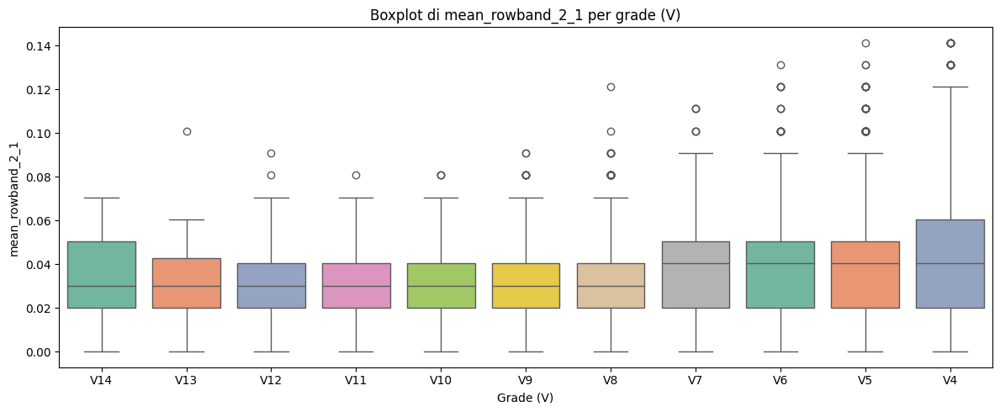

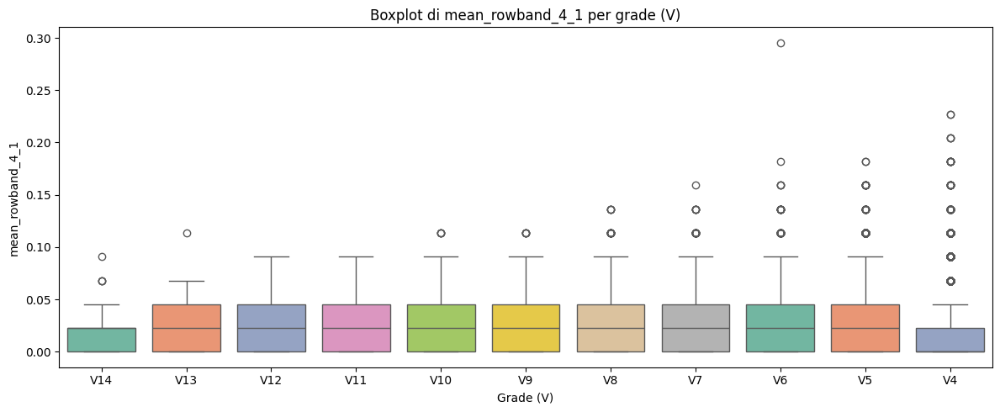

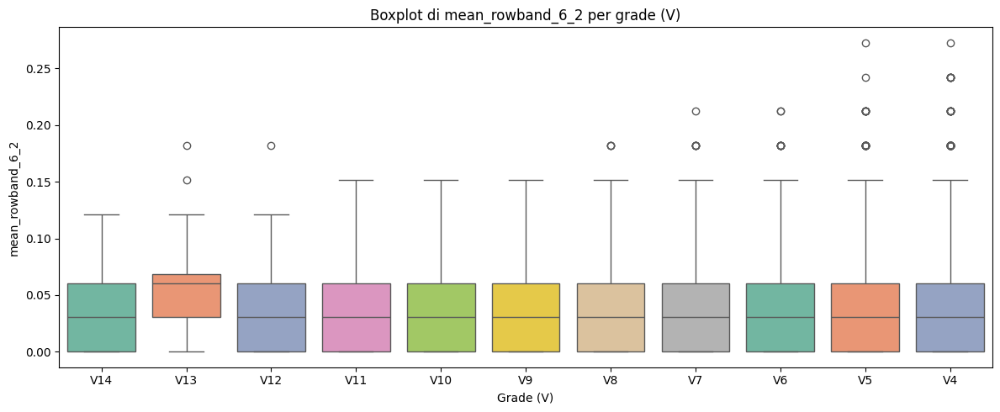

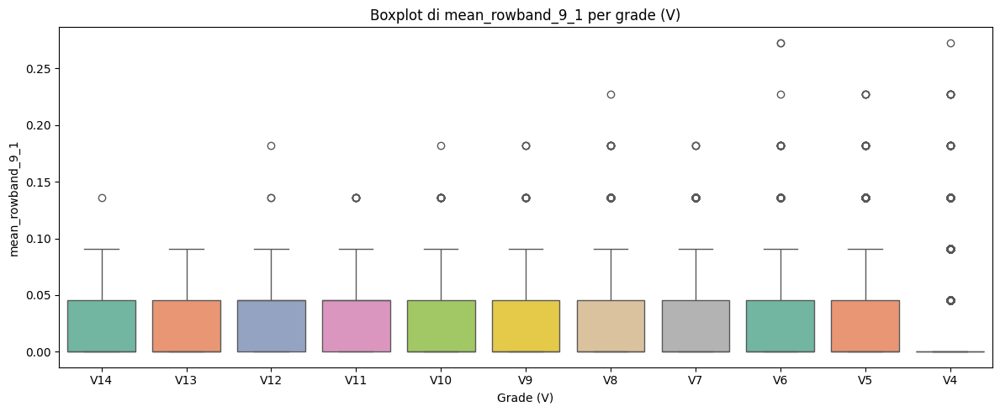

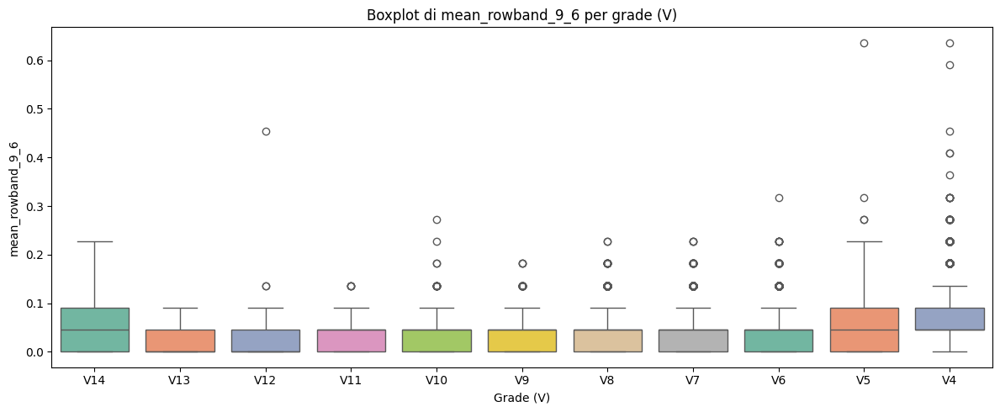

...

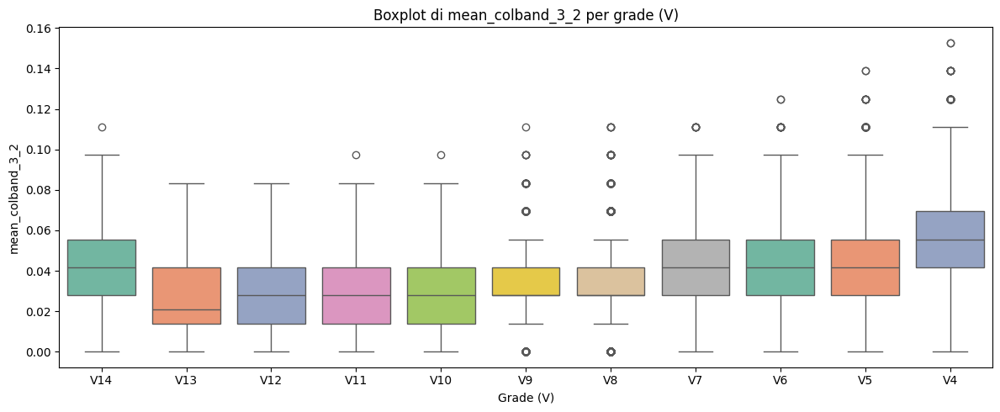

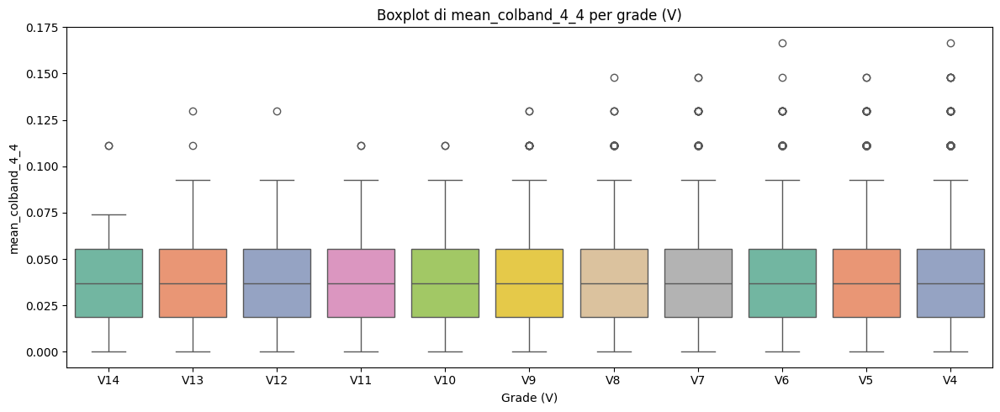

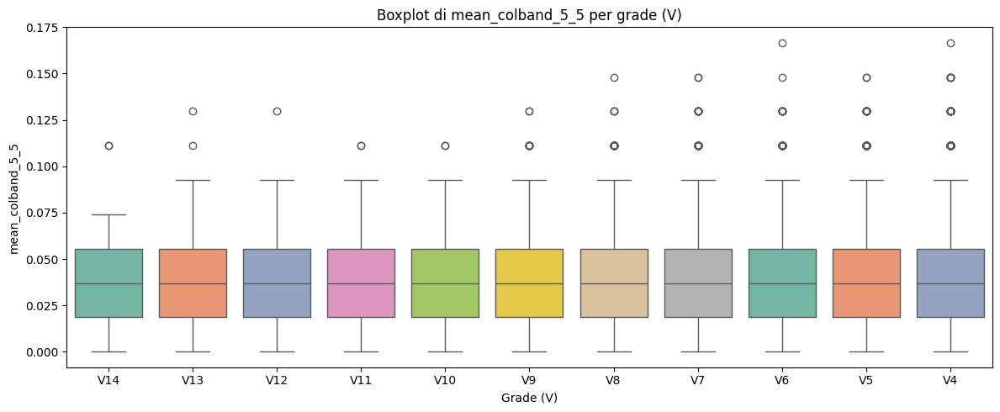

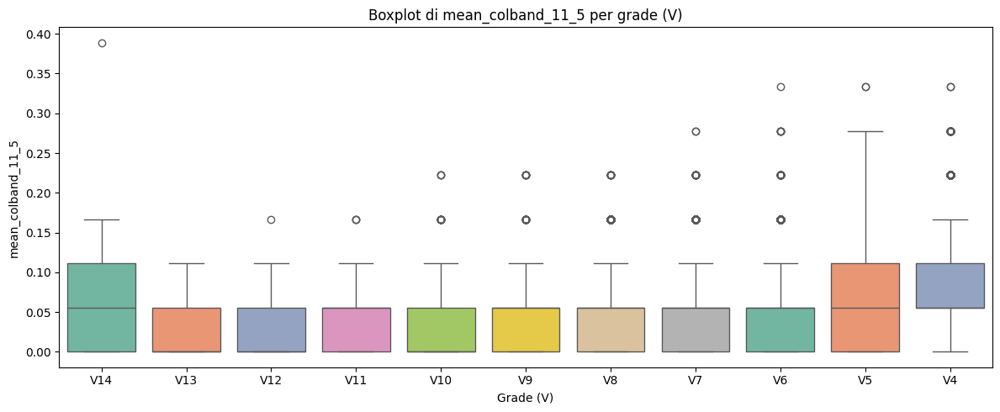

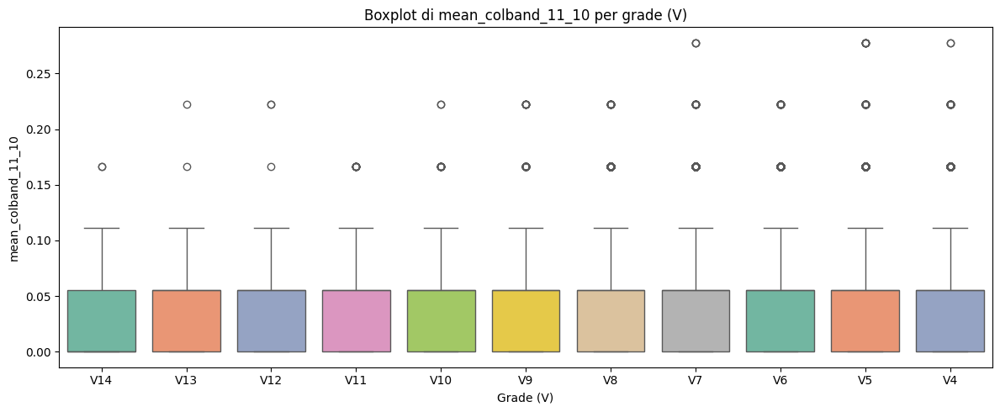

In [50]:
if 'grade_v' in df.columns:
    df['grade_v'] = pd.Categorical(df['grade_v'], categories=grade_order_desc_v, ordered=True)

# Boxplot per ciascuna variabile di banda, ma ne stampa solo una ogni 5
for i, var in enumerate(mean_band_vars):
    if var in df.columns and 'grade_v' in df.columns:
        if i % 5 == 0:  # stampa solo una ogni 5
            plt.figure(figsize=(12, 5))
            sns.boxplot(x='grade_v', y=var, data=df, hue='grade_v', palette="Set2", legend=False)
            plt.title(f'Boxplot di {var} per grade (V)')
            plt.xlabel('Grade (V)')
            plt.ylabel(var)
            plt.tight_layout()
            plt.show()

<Figure size 1000x400 with 0 Axes>

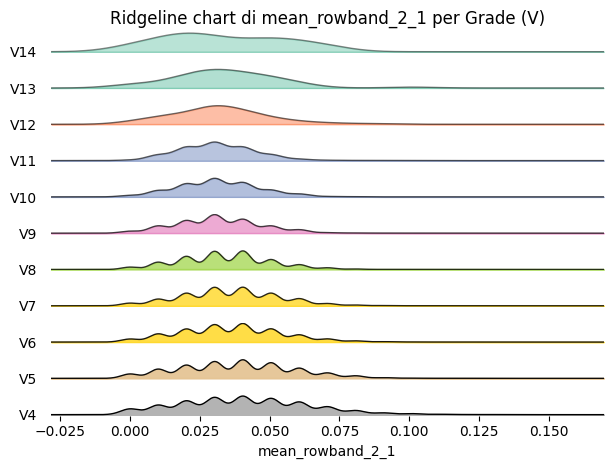

<Figure size 1000x400 with 0 Axes>

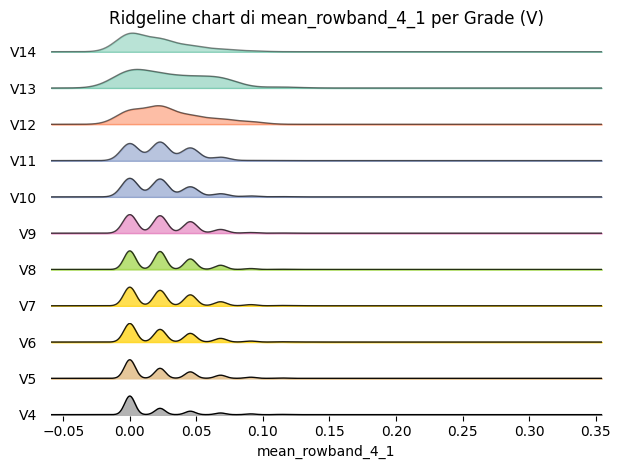

<Figure size 1000x400 with 0 Axes>

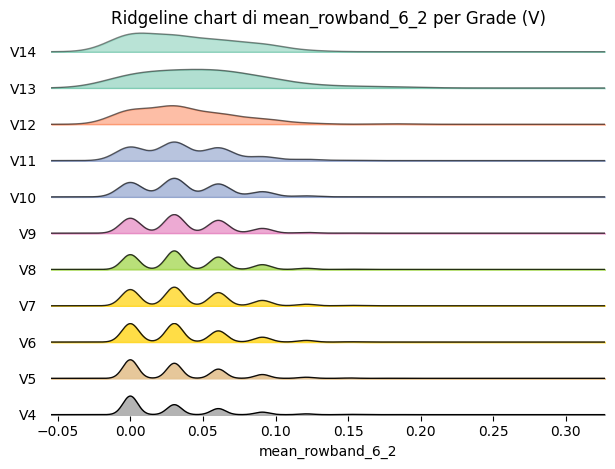

<Figure size 1000x400 with 0 Axes>

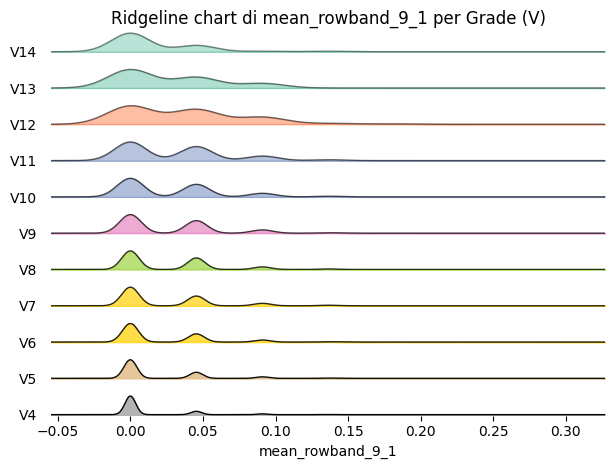

<Figure size 1000x400 with 0 Axes>

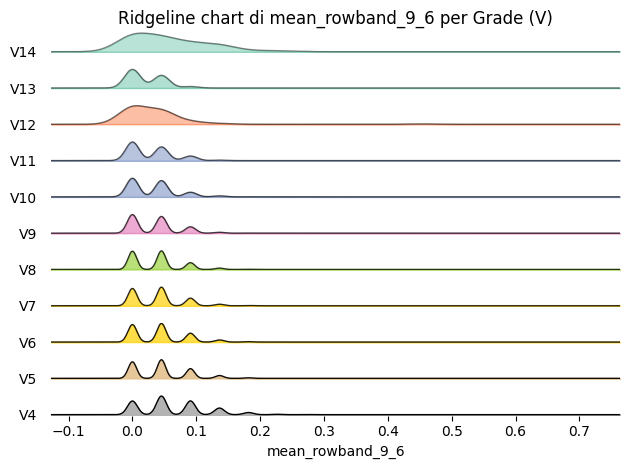

[SKIP] Variabile NON numerica o vuota: mean_rowband_18_1


<Figure size 1000x400 with 0 Axes>

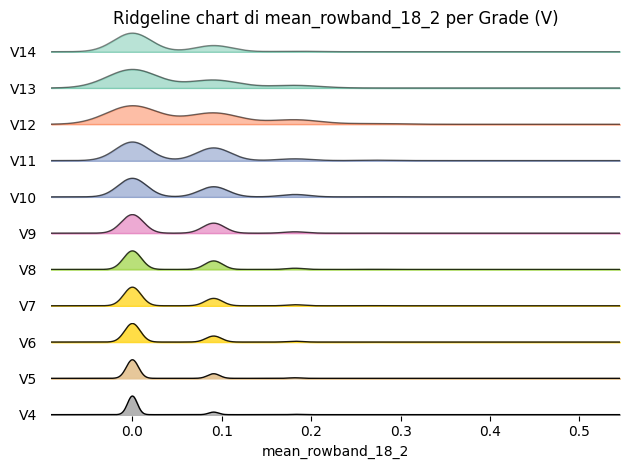

[SKIP] Variabile NON numerica o vuota: mean_rowband_18_4


<Figure size 1000x400 with 0 Axes>

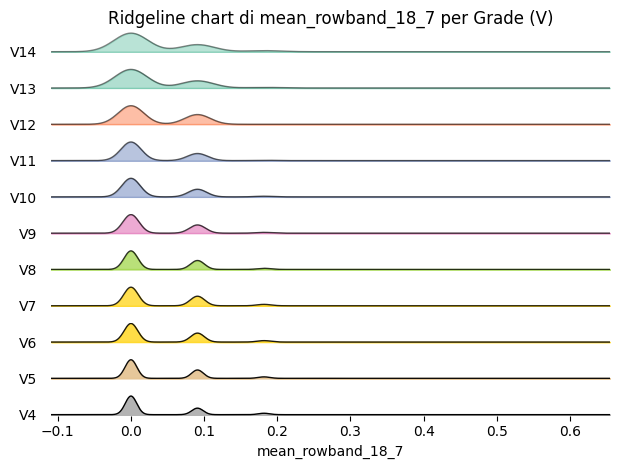

<Figure size 1000x400 with 0 Axes>

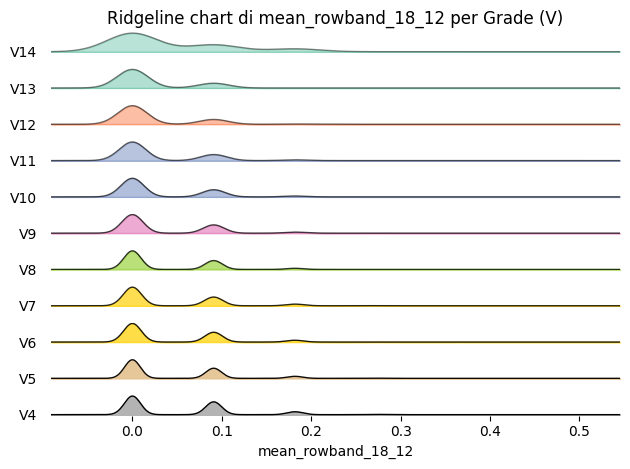

[SKIP] Variabile NON numerica o vuota: mean_rowband_18_14
[SKIP] Variabile NON numerica o vuota: mean_rowband_18_17


<Figure size 1000x400 with 0 Axes>

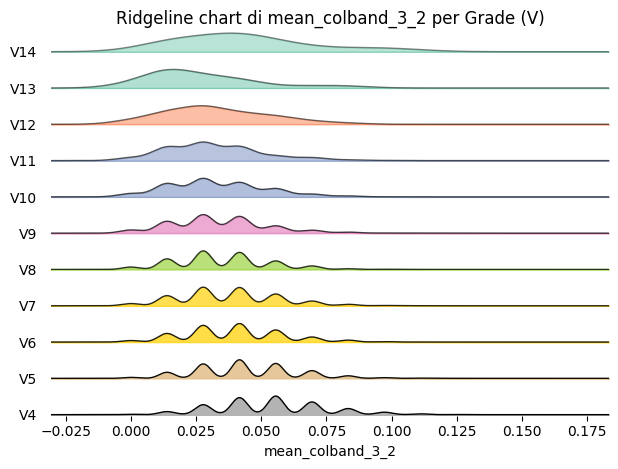

<Figure size 1000x400 with 0 Axes>

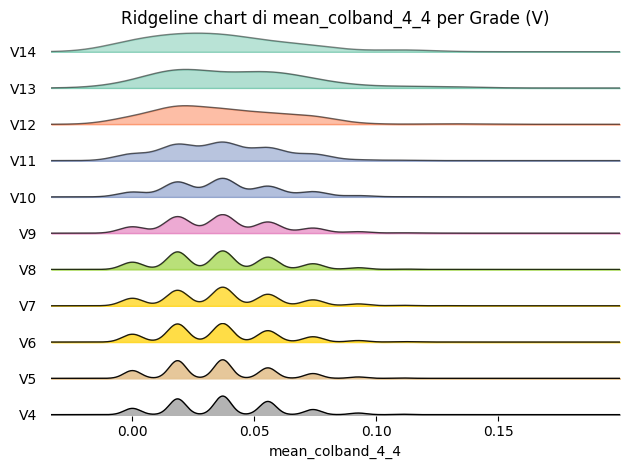

<Figure size 1000x400 with 0 Axes>

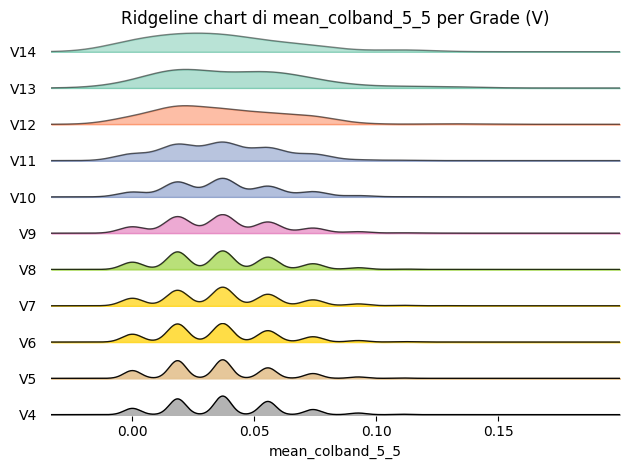

[SKIP] Variabile NON numerica o vuota: mean_colband_11_1


<Figure size 1000x400 with 0 Axes>

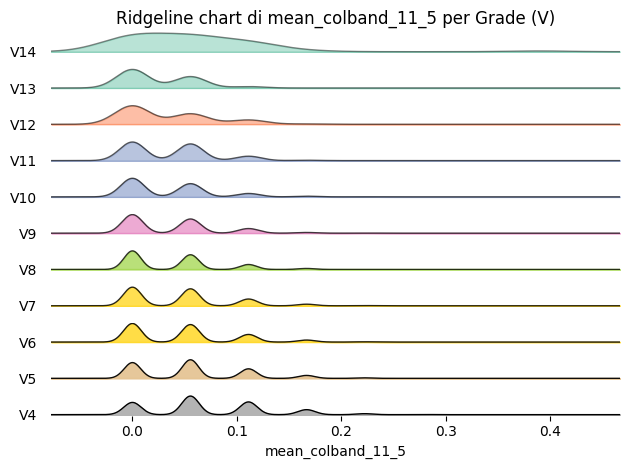

[SKIP] Variabile NON numerica o vuota: mean_colband_11_8
[SKIP] Variabile NON numerica o vuota: mean_colband_11_9


<Figure size 1000x400 with 0 Axes>

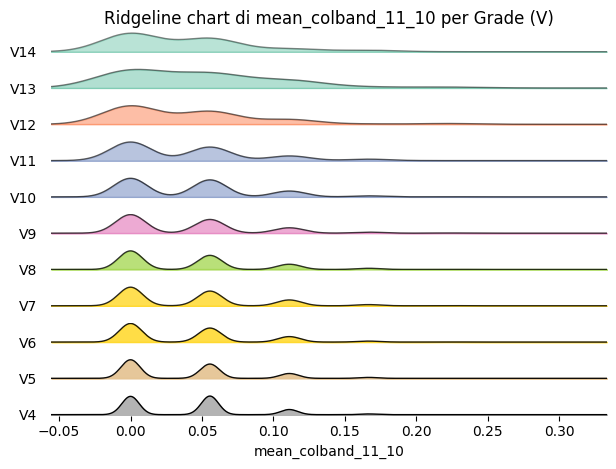

In [52]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

import joypy

# Ordina la colonna 'grade' in modo decrescente (da 8B+ a 6B)
grade_order_desc = [
    '8B+', '8B', '8A+', '8A', '7C+', '7C', '7B+', '7B', '7A+', '7A', '6C+', '6C', '6B+', '6B'
]

grade_order_desc_v = ['V14', 'V13', 'V12', 'V11', 'V10', 'V9', 'V8', 'V7', 'V6', 'V5', 'V4']

if 'grade' in df.columns:
    df['grade'] = pd.Categorical(df['grade'], categories=grade_order_desc, ordered=True)

if 'grade_v' in df.columns:
    df['grade_v'] = pd.Categorical(df['grade_v'], categories=grade_order_desc_v, ordered=True)

for i, var in enumerate(mean_band_vars):
    if var in df.columns and 'grade_v' in df.columns:
        # Controlla che la colonna sia numerica e abbia almeno un valore valido
        if not pd.api.types.is_numeric_dtype(df[var]) or df[var].dropna().empty:
            print(f"[SKIP] Variabile NON numerica o vuota: {var}")
            continue
        if i % 5 == 0:  # stampa solo una ogni 5
            plt.figure(figsize=(10, 4))
            joypy.joyplot(
                data=df,
                by='grade_v',
                column=var,
                ylim='own',
                colormap=plt.cm.Set2,
                linewidth=1,
                legend=False,
                fade=True,
                overlap=2.2,  # aumenta la sovrapposizione delle curve
                title=f'Ridgeline chart di {var} per Grade (V)'
            )
            plt.xlabel(var)
            plt.tight_layout()
            plt.show()

ANALISI DELLE CORRELAZIONI:

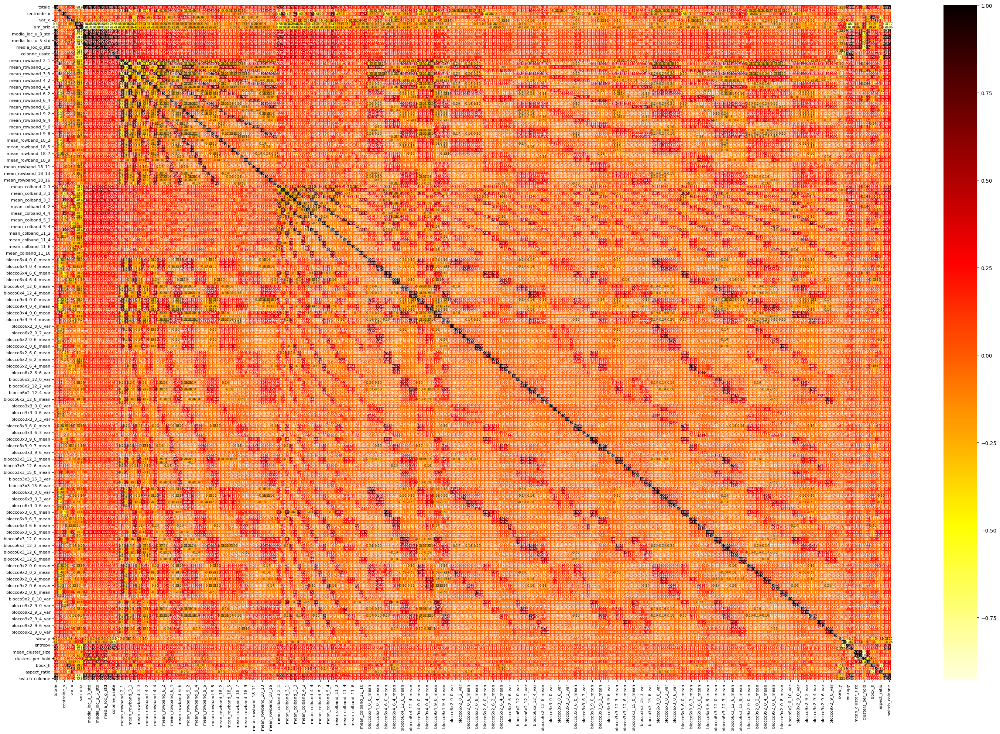

In [11]:
# Calcola la matrice di correlazione solo sulle quantitative
corr_matrix = df[quantitative_vars].corr()

# 1. Salva la heatmap completa come immagine ad alta risoluzione
plt.figure(figsize=(30, 20))  # aumenta la dimensione per la leggibilità
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="hot_r",
    center=0,
    annot_kws={"size": 6}
)
#plt.title("Matrice di correlazione delle variabili quantitative")
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.savefig("correlation_matrix_full.png", dpi=300)
plt.show()

In [ ]:
print(f"Numero variabili quantitative: {len(df[quantitative_vars].columns)}")
for idx, var in enumerate(df[quantitative_vars].columns):
    print(f"{idx}: {var}")

Numero variabili quantitative: 203
0: totale
1: centroide_y
2: centroide_x
3: var_y
4: var_x
5: sim_vert
6: sim_oriz
7: media_loc_u_3_mean
8: media_loc_u_3_std
9: media_loc_u_5_mean
10: media_loc_u_5_std
11: media_loc_g_mean
12: media_loc_g_std
13: media_loc_l_std
14: colonne_usate
15: righe_usate
16: mean_rowband_2_1
17: mean_rowband_2_2
18: mean_rowband_3_1
19: mean_rowband_3_2
20: mean_rowband_3_3
21: mean_rowband_4_1
22: mean_rowband_4_2
23: mean_rowband_4_3
24: mean_rowband_4_4
25: mean_rowband_6_1
26: mean_rowband_6_2
27: mean_rowband_6_3
28: mean_rowband_6_4
29: mean_rowband_6_5
30: mean_rowband_6_6
31: mean_rowband_9_1
32: mean_rowband_9_2
33: mean_rowband_9_3
34: mean_rowband_9_4
35: mean_rowband_9_5
36: mean_rowband_9_6
37: mean_rowband_9_7
38: mean_rowband_9_8
39: mean_rowband_9_9
40: mean_rowband_18_2
41: mean_rowband_18_3
42: mean_rowband_18_5
43: mean_rowband_18_6
44: mean_rowband_18_7
45: mean_rowband_18_8
46: mean_rowband_18_9
47: mean_rowband_18_10
48: mean_rowband_18_

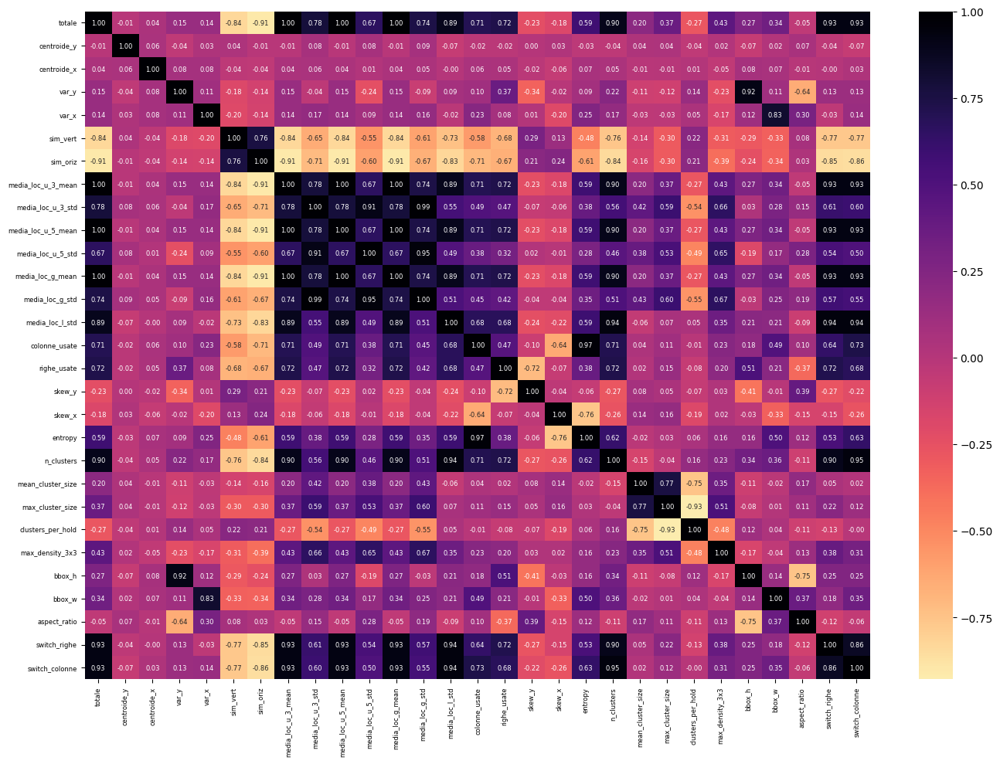

In [38]:
# Seleziona le variabili dagli indici 0-15 e da 190 in poi
section_indices = list(range(16)) + list(range(190, len(df[quantitative_vars].columns)))
section_vars = [df[quantitative_vars].columns[i] for i in section_indices]

# Crea la matrice di correlazione solo su queste variabili (righe e colonne uguali)
corr_matrix_section = df[section_vars].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix_section,
    annot=True,
    fmt=".2f",
    cmap="magma_r",
    center=0,
    annot_kws={"size": 6}
)
#plt.title("Matrice di correlazione (indici 0-15 e da 190 in poi)")
plt.xticks(fontsize=6, rotation=90)
plt.yticks(fontsize=6, rotation=0)
plt.tight_layout()
plt.show()

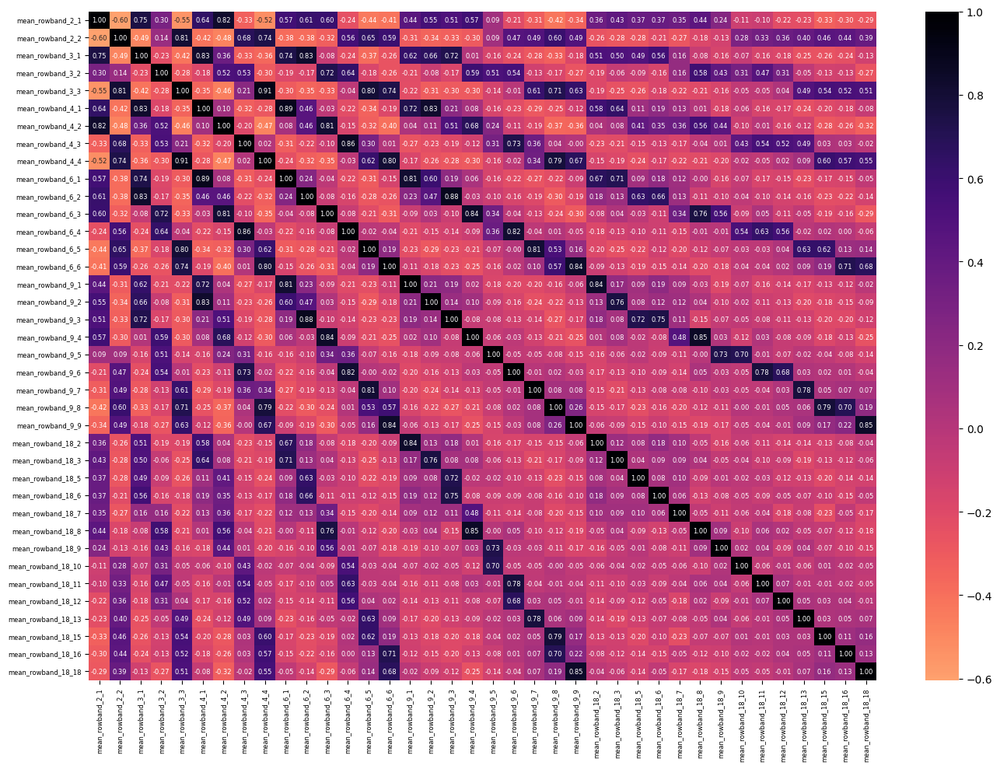

In [39]:
# Seleziona le variabili dagli indici 0-15 e da 190 in poi
section_indices = list(range(16, 54))
section_vars = [df[quantitative_vars].columns[i] for i in section_indices]

# Crea la matrice di correlazione solo su queste variabili (righe e colonne uguali)
corr_matrix_section = df[section_vars].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix_section,
    annot=True,
    fmt=".2f",
    cmap="magma_r",
    center=0,
    annot_kws={"size": 6}
)
#plt.title("Matrice di correlazione (indici 0-15 e da 190 in poi)")
plt.xticks(fontsize=6, rotation=90)
plt.yticks(fontsize=6, rotation=0)
plt.tight_layout()
plt.show()

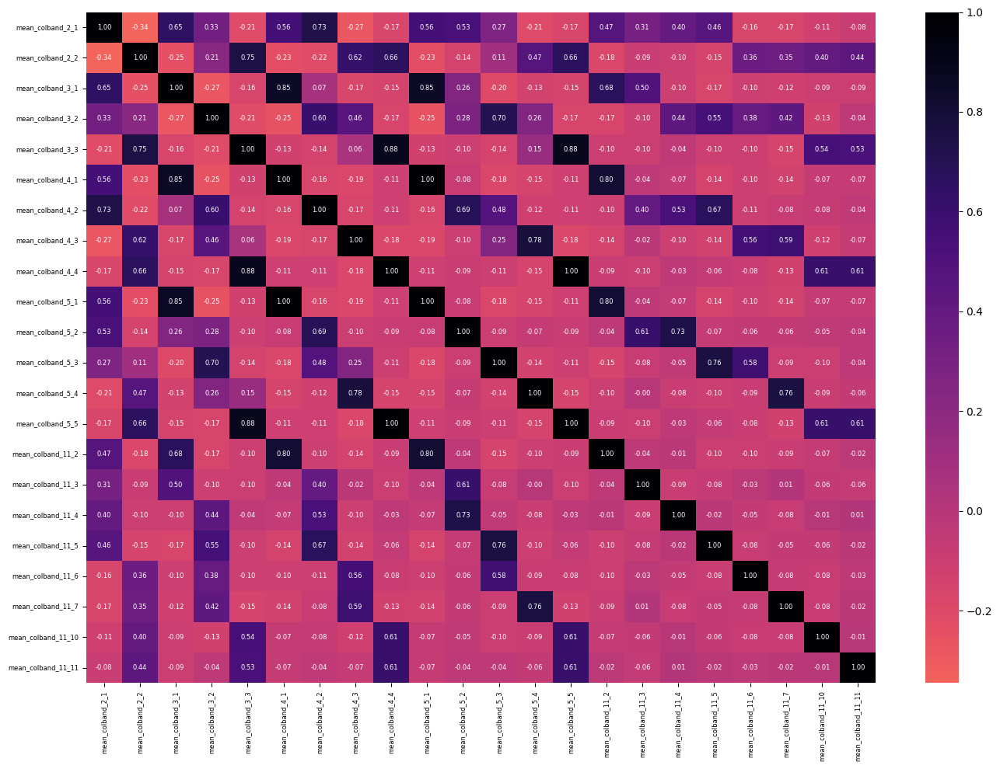

In [40]:
# Seleziona le variabili dagli indici 0-15 e da 190 in poi
section_indices = list(range(54, 76))
section_vars = [df[quantitative_vars].columns[i] for i in section_indices]

# Crea la matrice di correlazione solo su queste variabili (righe e colonne uguali)
corr_matrix_section = df[section_vars].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix_section,
    annot=True,
    fmt=".2f",
    cmap="magma_r",
    center=0,
    annot_kws={"size": 6}
)
#plt.title("Matrice di correlazione (indici 0-15 e da 190 in poi)")
plt.xticks(fontsize=6, rotation=90)
plt.yticks(fontsize=6, rotation=0)
plt.tight_layout()
plt.show()

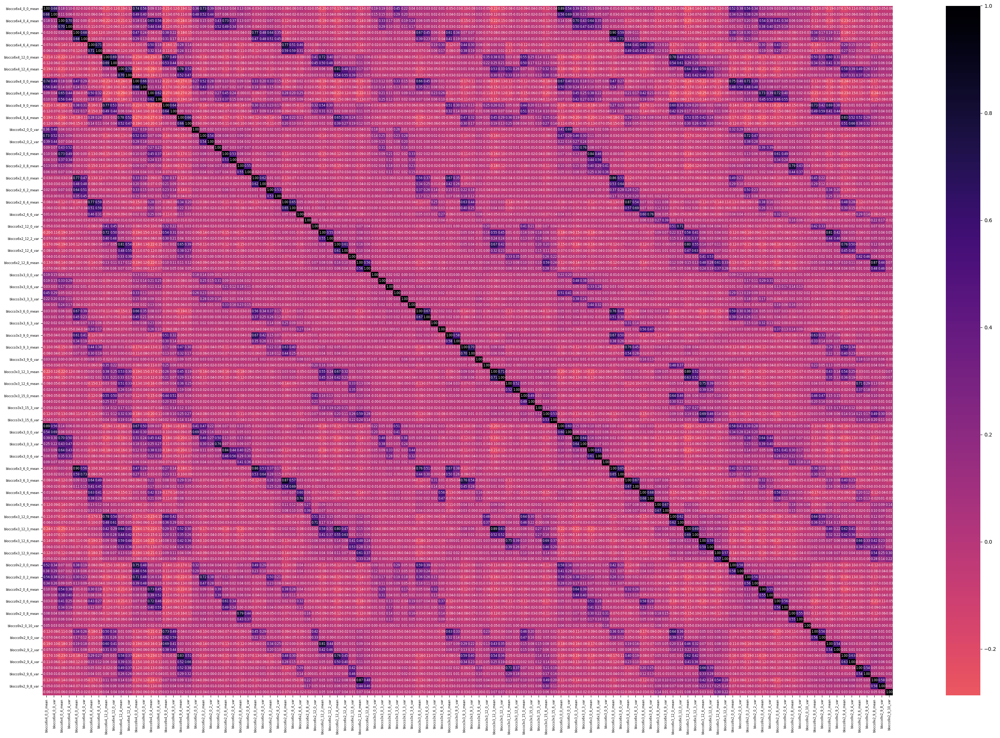

In [41]:
# Seleziona le variabili dagli indici 0-15 e da 190 in poi
section_indices = list(range(76, 190))
section_vars = [df[quantitative_vars].columns[i] for i in section_indices]

# Crea la matrice di correlazione solo su queste variabili (righe e colonne uguali)
corr_matrix_section = df[section_vars].corr()

plt.figure(figsize=(30, 20))
sns.heatmap(
    corr_matrix_section,
    annot=True,
    fmt=".2f",
    cmap="magma_r",
    center=0,
    annot_kws={"size": 6}
)
#plt.title("Matrice di correlazione (indici 0-15 e da 190 in poi)")
plt.xticks(fontsize=6, rotation=90)
plt.yticks(fontsize=6, rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
# Trova le coppie con |correlazione| >= 0.95 (escludendo la diagonale)
print("\nCOPPIE CON |CORRELAZIONE| >= 0.95:")
already_seen = set()
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and (col2, col1) not in already_seen:
            corr_val = corr_matrix.loc[col1, col2]
            if abs(corr_val) >= 0.95:
                print(f"{col1} <-> {col2}: {corr_val:.2f}")
                already_seen.add((col1, col2))


COPPIE CON |CORRELAZIONE| >= 0.95:
totale <-> media_loc_u_3_mean: 1.00
totale <-> media_loc_u_5_mean: 1.00
totale <-> media_loc_g_mean: 1.00
media_loc_u_3_mean <-> media_loc_u_5_mean: 1.00
media_loc_u_3_mean <-> media_loc_g_mean: 1.00
media_loc_u_3_std <-> media_loc_g_std: 0.99
media_loc_u_5_mean <-> media_loc_g_mean: 1.00
colonne_usate <-> entropy: 0.97


In [42]:
# Trova le coppie con |correlazione| >= 0.95 (escludendo la diagonale)
print("\nCOPPIE CON |CORRELAZIONE| >= 0.9:")
already_seen = set()
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and (col2, col1) not in already_seen:
            corr_val = corr_matrix.loc[col1, col2]
            if abs(corr_val) >= 0.9:
                print(f"{col1} <-> {col2}: {corr_val:.2f}")
                already_seen.add((col1, col2))


COPPIE CON |CORRELAZIONE| >= 0.9:
totale <-> sim_oriz: -0.91
totale <-> media_loc_u_3_mean: 1.00
totale <-> media_loc_u_5_mean: 1.00
totale <-> media_loc_g_mean: 1.00
totale <-> switch_righe: 0.93
totale <-> switch_colonne: 0.93
var_y <-> bbox_h: 0.92
sim_oriz <-> media_loc_u_3_mean: -0.91
sim_oriz <-> media_loc_u_5_mean: -0.91
sim_oriz <-> media_loc_g_mean: -0.91
media_loc_u_3_mean <-> media_loc_u_5_mean: 1.00
media_loc_u_3_mean <-> media_loc_g_mean: 1.00
media_loc_u_3_mean <-> switch_righe: 0.93
media_loc_u_3_mean <-> switch_colonne: 0.93
media_loc_u_3_std <-> media_loc_u_5_std: 0.91
media_loc_u_3_std <-> media_loc_g_std: 0.99
media_loc_u_5_mean <-> media_loc_g_mean: 1.00
media_loc_u_5_mean <-> switch_righe: 0.93
media_loc_u_5_mean <-> switch_colonne: 0.93
media_loc_u_5_std <-> media_loc_g_std: 0.95
media_loc_g_mean <-> switch_righe: 0.93
media_loc_g_mean <-> switch_colonne: 0.93
media_loc_l_std <-> n_clusters: 0.94
media_loc_l_std <-> switch_righe: 0.94
media_loc_l_std <-> switch_c

In [43]:
# Trova le coppie con correlazione esattamente 0 (escludendo la diagonale)
print("\nCOPPIE CON CORRELAZIONE = 0:")
already_seen = set()
for col1 in corr_matrix.columns:
    for col2 in corr_matrix.columns:
        if col1 != col2 and (col2, col1) not in already_seen:
            corr_val = corr_matrix.loc[col1, col2]
            if corr_val == 0:
                print(f"{col1} <-> {col2}: {corr_val:.2f}")
                already_seen.add((col1, col2))


COPPIE CON CORRELAZIONE = 0:


ANALISI ASSOCIAZIONI:

In [45]:
# Analisi delle associazioni tra variabili categoriali

from scipy.stats import chi2_contingency

# Seleziona solo le variabili categoriali
cat_vars = qualitative_vars

# Calcola la tabella di contingenza e il test chi-quadrato per ogni coppia di variabili categoriali
results = []
for i in range(len(cat_vars)):
    for j in range(i+1, len(cat_vars)):
        var1 = cat_vars[i]
        var2 = cat_vars[j]
        if df[var1].nunique() > 1 and df[var2].nunique() > 1:
            table = pd.crosstab(df[var1], df[var2])
            chi2, p, dof, expected = chi2_contingency(table)
            results.append({
                "var1": var1,
                "var2": var2,
                "chi2": chi2,
                "p-value": p,
                "dof": dof
            })

# Mostra le associazioni più significative (p < 0.05)
print("Associazioni significative tra variabili categoriali (p < 0.05):")
for r in results:
    if r["p-value"] < 0.05:
        print(f"{r['var1']} <-> {r['var2']}: chi2={r['chi2']:.2f}, p={r['p-value']:.4f}, dof={r['dof']}")

Associazioni significative tra variabili categoriali (p < 0.05):
grade <-> grade_v: chi2=476040.00, p=0.0000, dof=130
grade <-> isBenchmark: chi2=150.06, p=0.0000, dof=13
grade <-> holdsets: chi2=5199.29, p=0.0000, dof=78
grade <-> A5: chi2=197.11, p=0.0000, dof=13
grade <-> A9: chi2=64.54, p=0.0000, dof=13
grade <-> A10: chi2=225.32, p=0.0000, dof=13
grade <-> A11: chi2=330.20, p=0.0000, dof=13
grade <-> A12: chi2=196.17, p=0.0000, dof=13
grade <-> A13: chi2=238.25, p=0.0000, dof=13
grade <-> A14: chi2=36.79, p=0.0004, dof=13
grade <-> A15: chi2=272.26, p=0.0000, dof=13
grade <-> A16: chi2=230.30, p=0.0000, dof=13
grade <-> A18: chi2=587.77, p=0.0000, dof=13
grade <-> B3: chi2=167.89, p=0.0000, dof=13
grade <-> B4: chi2=1258.69, p=0.0000, dof=13
grade <-> B6: chi2=150.93, p=0.0000, dof=13
grade <-> B7: chi2=149.05, p=0.0000, dof=13
grade <-> B8: chi2=149.60, p=0.0000, dof=13
grade <-> B9: chi2=107.55, p=0.0000, dof=13
grade <-> B10: chi2=106.01, p=0.0000, dof=13
grade <-> B11: chi2=16